
# Analysis Data PFT Scanner Pilots -- Extracting reports from online questionnaires

## Load data and relevant variables participants
 --------


In [13]:
data_exp1 = pd.read_csv('/Users/pradyumna/OneDrive - University College London/PhD Projects/PFT_MRI_Experiment/Scanner Pilot/All_Behavioral/PFT_Choice_Onsets_Partic_AllJoined.csv') 
data_exp_ratings_2 = pd.read_csv('/Users/pradyumna/OneDrive - University College London/PhD Projects/PFT_MRI_Experiment/Scanner Pilot/All_Behavioral/PFT_Rate_Onsets_Partic_AllJoined.csv') 

In [14]:
# Insert to exclude particitipants
excludedPart =  [4,5,8,15,16,27,32]
for i in excludedPart:
    data_exp1 = data_exp1[(data_exp1.part != i)]
    data_exp_ratings_2 = data_exp_ratings_2[(data_exp_ratings_2.part != i)]
print (data_exp1["part"].unique())
print ('Number of participants: ' + str(len(data_exp1["part"].unique())))

[ 3  6  7  9 10 11 12 13 14 17 18 19 20 21 22 23 24 25 26 28 29 30 31 33
 34 35 36 37 38]
Number of participants: 29


In [15]:
data_exp1.columns

Index(['trial', 'trialOnset', 'leftId', 'rightId', 'frame', 'trialOnsetTim',
       'trialSnd1Tim', 'trialSnd2Tim', 'trialThinkTime', 'trialRespTime',
       'trialEnd', 'choice', 'choiceTime', 'primerSound', 'part', 'session',
       'LRat1', 'RRat1', 'LRat2', 'RRat2', 'LVar1', 'RVar1', 'LVar2', 'RVar2',
       'LValOn', 'RValOn', 'LFamOn', 'RFamOn', 'TotVal1', 'TotVal2', 'DVal1',
       'absDVal1', 'DVar1', 'absDVar1', 'DVal2', 'absDVal2', 'DVar2',
       'absDVar2', 'ChosenVal1', 'UnchosenVal1', 'DChoUnchosen1', 'ChosenVal2',
       'UnchosenVal2', 'DChoUnchosen2', 'zLRat1', 'zRRat1', 'zLRat2', 'zRRat2',
       'zLValOn', 'zRValOn', 'zLFamOn', 'zRFamOn', 'zLVar1', 'zRVar1',
       'zLVar2', 'zRVar2', 'zDVal1', 'zabsDVal1', 'zDVal2', 'zabsDVal2',
       'zDVar1', 'zabsDVar1', 'zDVar2', 'zabsDVar2', 'zTotVal1', 'zTotVal2',
       'zChoiceTime', 'zChosenVal1', 'zUnchosenVal1', 'zChosenVal2',
       'zUnchosenVal2', 'zDChoUnchosen1', 'zDChoUnchosen2', 'ChosenValOn',
       'UnchosenValO

In [16]:
data_exp1

,trial,trialOnset,leftId,rightId,frame,trialOnsetTim,trialSnd1Tim,trialSnd2Tim,trialThinkTime,trialRespTime,...,DChoUnchosenOnFlipDis,TotValOnFlipDis,LValOnFlip,RValOnFlip,zLValOnFlip,zRValOnFlip,zChosenValOnFlipDis,zUnchosenValOnFlipDis,zDChoUnchosenOnFlipDis,zTotValOnFlipDis
0,0.0,97.154134,6.0,2.0,2.0,97.162739,98.174875,98.675894,100.661222,100.661725,...,-2.0,6.0,4,2,1.341641,-0.447214,-1.230401,2.217432,-2.415792,0.769699
1,1.0,107.304030,5.0,6.0,1.0,107.314542,108.334392,108.835600,110.819337,110.819687,...,-1.0,3.0,3,4,0.447214,1.341641,-2.328418,0.126075,-1.670439,-1.539399
2,2.0,118.904234,6.0,2.0,1.0,118.911135,119.928075,120.429292,122.413088,122.413422,...,2.0,4.0,4,2,1.341641,-0.447214,-0.132385,-0.919604,0.565623,-0.769699
3,3.0,131.955079,5.0,6.0,2.0,131.961902,132.989758,133.490987,135.456976,135.457324,...,-1.0,7.0,3,4,0.447214,1.341641,-0.132385,2.217432,-1.670439,1.539399
4,4.0,162.405880,5.0,2.0,1.0,162.413470,163.444844,163.946065,165.916748,165.917095,...,1.0,5.0,3,2,0.447214,-0.447214,-0.132385,0.126075,-0.179731,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5179,19.0,449.514783,2.0,5.0,1.0,449.522606,450.555727,451.056159,453.021524,453.021728,...,3.0,5.0,1,4,-1.341641,1.341641,0.959309,-1.015400,1.301327,0.000000
5180,20.0,462.564662,2.0,5.0,1.0,462.571716,463.607038,464.107199,466.073238,466.073492,...,3.0,5.0,1,4,-1.341641,1.341641,0.959309,-1.015400,1.301327,0.000000
5181,21.0,491.565453,5.0,2.0,2.0,491.573173,492.612295,493.112731,495.074771,495.075127,...,3.0,5.0,4,1,1.341641,-1.341641,0.959309,-1.015400,1.301327,0.000000
5182,22.0,530.717474,1.0,6.0,2.0,530.725057,531.743107,532.244463,534.225137,534.225343,...,-1.0,5.0,3,2,0.447214,-0.447214,-1.000422,1.058917,-1.357098,0.000000


In [17]:
data_exp_ratings_2

,Unnamed: 0,trial,trialOnset,picId,picNum,frame,rating,trialImageOnst,trialRateOnst,trialRatEnd,...,zVal2,zVar1,zVar2,zExVal,zValOnl,zFamlOnl,ValOnlFlip,zValOnlFlip,ValOnlFlipDis,zValOnlFlipDis
0,0,1.0,18.850946,2.0,19.0,2.0,-1.0,19.357367,-1.000000,-1.000000,...,0.426401,-0.657193,-1.686787,1.111299,0.447214,0.732673,2,-0.447214,2.0,-0.447214
1,1,2.0,24.651001,5.0,23.0,2.0,-1.0,25.243570,-1.000000,-1.000000,...,0.426401,-0.408732,0.933146,-0.383318,-0.447214,-1.124399,3,0.447214,3.0,0.447214
2,2,3.0,33.351696,1.0,23.0,2.0,-1.0,33.911593,-1.000000,-1.000000,...,-1.705606,1.723117,0.376821,0.544375,1.341641,1.225958,1,-1.341641,1.0,-1.341641
3,3,4.0,42.052167,2.0,22.0,2.0,-1.0,42.644173,-1.000000,-1.000000,...,0.426401,-0.657193,-1.686787,-0.022548,0.447214,0.732673,2,-0.447214,2.0,-0.447214
4,4,5.0,49.301875,5.0,17.0,2.0,2.0,49.863565,54.904632,57.290269,...,0.426401,-0.408732,0.933146,0.647452,-0.447214,-1.124399,3,0.447214,3.0,0.447214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6907,27,28.0,503.166701,5.0,36.0,2.0,-1.0,503.725156,-1.000000,-1.000000,...,-0.091842,-0.999784,-0.668125,-1.863969,-1.341641,-0.962110,4,1.341641,4.0,1.341641
6908,28,29.0,508.966393,6.0,38.0,2.0,-1.0,509.524721,-1.000000,-1.000000,...,0.520435,1.029199,1.414655,0.609666,0.447214,-0.803955,2,-0.447214,2.0,-0.447214
6909,29,30.0,517.666486,6.0,35.0,1.0,-1.0,518.225645,-1.000000,-1.000000,...,0.520435,1.029199,1.414655,0.786355,0.447214,-0.803955,2,-0.447214,3.0,0.447214
6910,30,31.0,524.916532,1.0,36.0,2.0,-1.0,525.475811,-1.000000,-1.000000,...,-1.561306,0.970369,-1.171296,0.521322,-0.447214,0.224053,3,0.447214,3.0,0.447214


In [18]:
data_exp1=data_exp1.rename(index=str, columns={"choiceTime":"RT",
                                              "part":"Part"})

data_exp_ratings_2 = data_exp_ratings_2.rename(index=str, columns={"choiceTime":"RT",
                                              "part":"Part"})

## drop NaNs from choice rows

In [19]:
#data_exp1 = data_exp1.dropna(axis = 0, how ='any') 
#data_exp_ratings_2 = data_exp_ratings_2.dropna(axis = 0, how ='any') 

In [20]:
data_exp1 = data_exp1.reset_index()
data_exp_ratings_2 = data_exp_ratings_2.reset_index()

## add extra value information

In [21]:
data_exp1["TotVal1"] = data_exp1['RRat1']+ data_exp1['LRat1']
data_exp1["TotVal2"] = data_exp1['RRat2']+ data_exp1['LRat2']


data_exp1["DVal1"] = data_exp1['RRat1'] - data_exp1['LRat1']
data_exp1["absDVal1"] = np.abs(data_exp1["DVal1"] )

data_exp1["DVar1"] = data_exp1['RVar1'] - data_exp1['LVar1']
data_exp1["absDVar1"] = np.abs(data_exp1["DVar1"] )

data_exp1["DVal2"] = data_exp1['RRat2'] - data_exp1['LRat2']
data_exp1["absDVal2"] = np.abs(data_exp1["DVal2"] )

data_exp1["DVar2"] = data_exp1['RVar2'] - data_exp1['LVar2']
data_exp1["absDVar2"] = np.abs(data_exp1["DVar2"] )

## add z-scores

In [22]:
data_exp1["zDVal1"] = z_score1(data_exp1,'Part',"DVal1")
data_exp1["zabsDVal1"] = z_score1(data_exp1,'Part',"absDVal1")

data_exp1["zDVal2"] = z_score1(data_exp1,'Part',"DVal2")
data_exp1["zabsDVal2"] = z_score1(data_exp1,'Part',"absDVal2")

data_exp1["zDVar1"] = z_score1(data_exp1,'Part',"DVar1")
data_exp1["zabsDVar1"] = z_score1(data_exp1,'Part',"absDVar1")

data_exp1["zDVar2"] = z_score1(data_exp1,'Part',"DVar2")
data_exp1["zabsDVar2"] = z_score1(data_exp1,'Part',"absDVar2")

data_exp1["zTotVal1"] = z_score1(data_exp1,'Part',"TotVal1")
data_exp1["zTotVal2"] = z_score1(data_exp1,'Part',"TotVal2")
data_exp1["zRT"] = z_score1(data_exp1,'Part',"RT")

## correct option according to rating given in frame 1

In [23]:
Correct = []
for i in range(len(data_exp1)):
    if data_exp1.frame[i] == 1:
        if (data_exp1.choice[i] == 1 and (data_exp1.LValOn[i] <= data_exp1.RValOn[i])) or (data_exp1.choice[i] == -1 and (data_exp1.LValOn[i] >= data_exp1.RValOn[i])):
            Correct.append(1)
        else:
            Correct.append(0)
    if data_exp1.frame[i] == 2:
        if (data_exp1.choice[i] == 1 and (data_exp1.LValOn[i] >= data_exp1.RValOn[i])) or (data_exp1.choice[i] == -1 and (data_exp1.LValOn[i] <= data_exp1.RValOn[i])):
            Correct.append(1)
        else:
            Correct.append(0)

data_exp1["correctOn"] = Correct

## change choices from -1 to 0 for left

In [24]:
choices = []
for i in range(len(data_exp1)):
        if (data_exp1.choice[i] == 1):
            choices.append(1)
        else:
            choices.append(0)

data_exp1["choices"] = choices

In [25]:
data_exp1

,index,trial,trialOnset,leftId,rightId,frame,trialOnsetTim,trialSnd1Tim,trialSnd2Tim,trialThinkTime,...,RValOnFlip,zLValOnFlip,zRValOnFlip,zChosenValOnFlipDis,zUnchosenValOnFlipDis,zDChoUnchosenOnFlipDis,zTotValOnFlipDis,zRT,correctOn,choices
0,0,0.0,97.154134,6.0,2.0,2.0,97.162739,98.174875,98.675894,100.661222,...,2,1.341641,-0.447214,-1.230401,2.217432,-2.415792,0.769699,-1.602820,0,1
1,1,1.0,107.304030,5.0,6.0,1.0,107.314542,108.334392,108.835600,110.819337,...,4,0.447214,1.341641,-2.328418,0.126075,-1.670439,-1.539399,-1.546306,0,1
2,2,2.0,118.904234,6.0,2.0,1.0,118.911135,119.928075,120.429292,122.413088,...,2,1.341641,-0.447214,-0.132385,-0.919604,0.565623,-0.769699,-1.454780,1,1
3,3,3.0,131.955079,5.0,6.0,2.0,131.961902,132.989758,133.490987,135.456976,...,4,0.447214,1.341641,-0.132385,2.217432,-1.670439,1.539399,-1.374383,0,0
4,4,4.0,162.405880,5.0,2.0,1.0,162.413470,163.444844,163.946065,165.916748,...,2,0.447214,-0.447214,-0.132385,0.126075,-0.179731,0.000000,-1.158225,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4171,5179,19.0,449.514783,2.0,5.0,1.0,449.522606,450.555727,451.056159,453.021524,...,4,-1.341641,1.341641,0.959309,-1.015400,1.301327,0.000000,0.854867,1,0
4172,5180,20.0,462.564662,2.0,5.0,1.0,462.571716,463.607038,464.107199,466.073238,...,4,-1.341641,1.341641,0.959309,-1.015400,1.301327,0.000000,0.949666,1,0
4173,5181,21.0,491.565453,5.0,2.0,2.0,491.573173,492.612295,493.112731,495.074771,...,1,1.341641,-1.341641,0.959309,-1.015400,1.301327,0.000000,1.166760,1,0
4174,5182,22.0,530.717474,1.0,6.0,2.0,530.725057,531.743107,532.244463,534.225137,...,2,0.447214,-0.447214,-1.000422,1.058917,-1.357098,0.000000,1.458080,0,1


## Rating data analysis for both frames
------------------------
## frame 1: like / frame 2: dislike
## pet number id: 1:dog ; 2:cat ; 5:parrot ; 6: hamster

###  1. mean rating in both frames 


In [26]:
#sns.set(font_scale=1.5, style='white')
#ax = data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == 1)].plot.bar(x='nameId',y=['rat1','rat2'], figsize=(20,5), )
#plt.suptitle('Participant ' + str(1), fontsize = 25)#

#sns.despine()

In [27]:
data_exp_ratings_2

,index,Unnamed: 0,trial,trialOnset,picId,picNum,frame,rating,trialImageOnst,trialRateOnst,...,zVal2,zVar1,zVar2,zExVal,zValOnl,zFamlOnl,ValOnlFlip,zValOnlFlip,ValOnlFlipDis,zValOnlFlipDis
0,0,0,1.0,18.850946,2.0,19.0,2.0,-1.0,19.357367,-1.000000,...,0.426401,-0.657193,-1.686787,1.111299,0.447214,0.732673,2,-0.447214,2.0,-0.447214
1,1,1,2.0,24.651001,5.0,23.0,2.0,-1.0,25.243570,-1.000000,...,0.426401,-0.408732,0.933146,-0.383318,-0.447214,-1.124399,3,0.447214,3.0,0.447214
2,2,2,3.0,33.351696,1.0,23.0,2.0,-1.0,33.911593,-1.000000,...,-1.705606,1.723117,0.376821,0.544375,1.341641,1.225958,1,-1.341641,1.0,-1.341641
3,3,3,4.0,42.052167,2.0,22.0,2.0,-1.0,42.644173,-1.000000,...,0.426401,-0.657193,-1.686787,-0.022548,0.447214,0.732673,2,-0.447214,2.0,-0.447214
4,4,4,5.0,49.301875,5.0,17.0,2.0,2.0,49.863565,54.904632,...,0.426401,-0.408732,0.933146,0.647452,-0.447214,-1.124399,3,0.447214,3.0,0.447214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,6907,27,28.0,503.166701,5.0,36.0,2.0,-1.0,503.725156,-1.000000,...,-0.091842,-0.999784,-0.668125,-1.863969,-1.341641,-0.962110,4,1.341641,4.0,1.341641
5564,6908,28,29.0,508.966393,6.0,38.0,2.0,-1.0,509.524721,-1.000000,...,0.520435,1.029199,1.414655,0.609666,0.447214,-0.803955,2,-0.447214,2.0,-0.447214
5565,6909,29,30.0,517.666486,6.0,35.0,1.0,-1.0,518.225645,-1.000000,...,0.520435,1.029199,1.414655,0.786355,0.447214,-0.803955,2,-0.447214,3.0,0.447214
5566,6910,30,31.0,524.916532,1.0,36.0,2.0,-1.0,525.475811,-1.000000,...,-1.561306,0.970369,-1.171296,0.521322,-0.447214,0.224053,3,0.447214,3.0,0.447214


## 2.reaction times for each participant in frame 1 (blue) and 2 (red)
### substract time till the response is available (raw RT in this case is the time from the beginning of the trial, which includes the sound stimuli)

In [28]:
# fig, ax = plt.subplots()
# figure(figsize=(16,7))
# 
# sns.set(font_scale=1.5, style='white')
# 
# width = 0.25
# #partNames = data_exp1.Part.unique()
# partNames = range(3, 3+len(data_exp1["Part"].unique()))
# 
# 
# 
# for i in np.arange(len(partNames)):
#     RT1 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 1) ].RT-3.5
#     RT2 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 2) ].RT-3.5
# 
#     RT_mean1 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 1) ].RT.mean()-3.5
#     RT_mean2 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 2) ].RT.mean()-3.5
#     print ('participant: ' + str(i))
#     print ('RT frame 1: ' + str(RT_mean1))
#     print ('RT frame 2: ' + str(RT_mean2))
# 
#     plt.bar(i-0.25, RT_mean1,width,color='b', label = 'Like')
# 
#     plt.scatter([i-0.25]*len(RT1),RT1 ,color='black', alpha=0.3, marker='o', label = 'Like')
# 
# 
#     plt.bar(i+0.25, RT_mean2,width,color='r', label = 'Dislike')
#     plt.scatter([i+0.25]*len(RT2),RT2 ,color='black', alpha=0.3, marker='o', label = 'Dislike')
# 
# plt.xticks(range(len(partNames)), partNames)
# plt.xlabel("Subject")
# plt.ylabel("RT [s] ")
# #plt.xticks([i-0.5,i+0.5],["Like ","Dislike"], rotation=0, fontsize=25)
# #plt.legend()
# sns.despine()

## 3. participant densities online

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

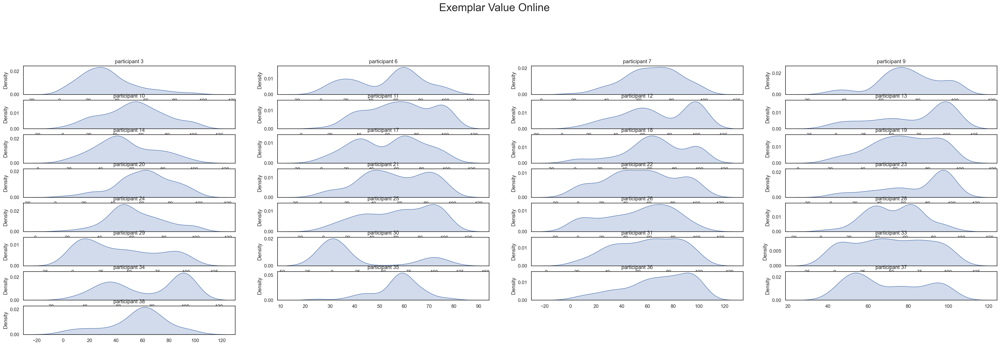

In [29]:
participant_densities(data_exp_ratings_2,'ExVal', title = 'Exemplar Value Online')

## 5.Pet ratings (value)

### Compare Value Online vs Exemplar value

Pearson's r = 0.61 p =  0.0
Pearson's r = 0.416 p =  0.0
Pearson's r = 0.387 p =  0.0
Pearson's r = -0.013 p =  0.861
Pearson's r = 0.318 p =  0.0
Pearson's r = 0.535 p =  0.0
Pearson's r = 0.094 p =  0.196
Pearson's r = -0.006 p =  0.93
Pearson's r = 0.61 p =  0.0
Pearson's r = 0.134 p =  0.064
Pearson's r = 0.427 p =  0.0
Pearson's r = 0.359 p =  0.0
Pearson's r = 0.125 p =  0.085
Pearson's r = 0.415 p =  0.0
Pearson's r = -0.053 p =  0.467
Pearson's r = 0.374 p =  0.0
Pearson's r = 0.079 p =  0.276
Pearson's r = 0.518 p =  0.0
Pearson's r = 0.433 p =  0.0
Pearson's r = 0.356 p =  0.0
Pearson's r = 0.178 p =  0.014
Pearson's r = 0.769 p =  0.0
Pearson's r = 0.246 p =  0.001
Pearson's r = 0.433 p =  0.0


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Pearson's r = 0.872 p =  0.0
Pearson's r = -0.073 p =  0.313
Pearson's r = 0.196 p =  0.006
Pearson's r = 0.311 p =  0.0
Pearson's r = 0.383 p =  0.0


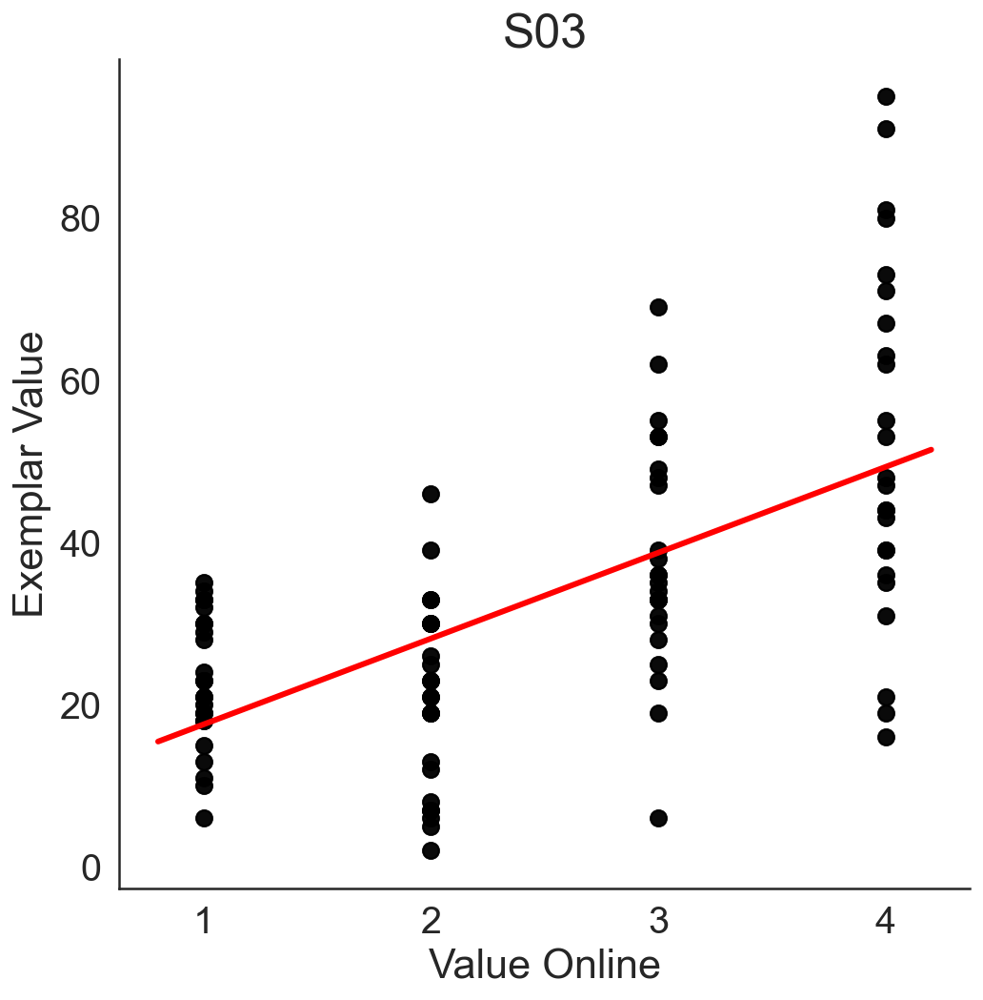

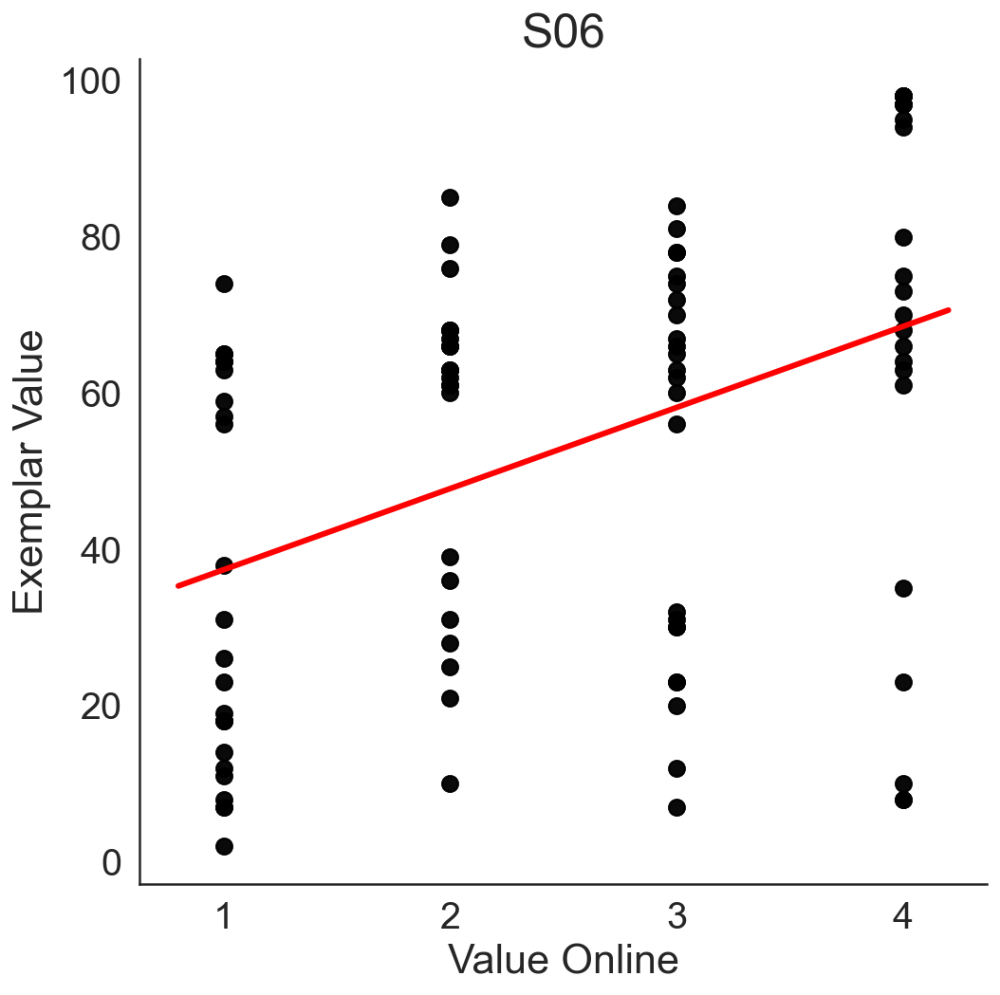

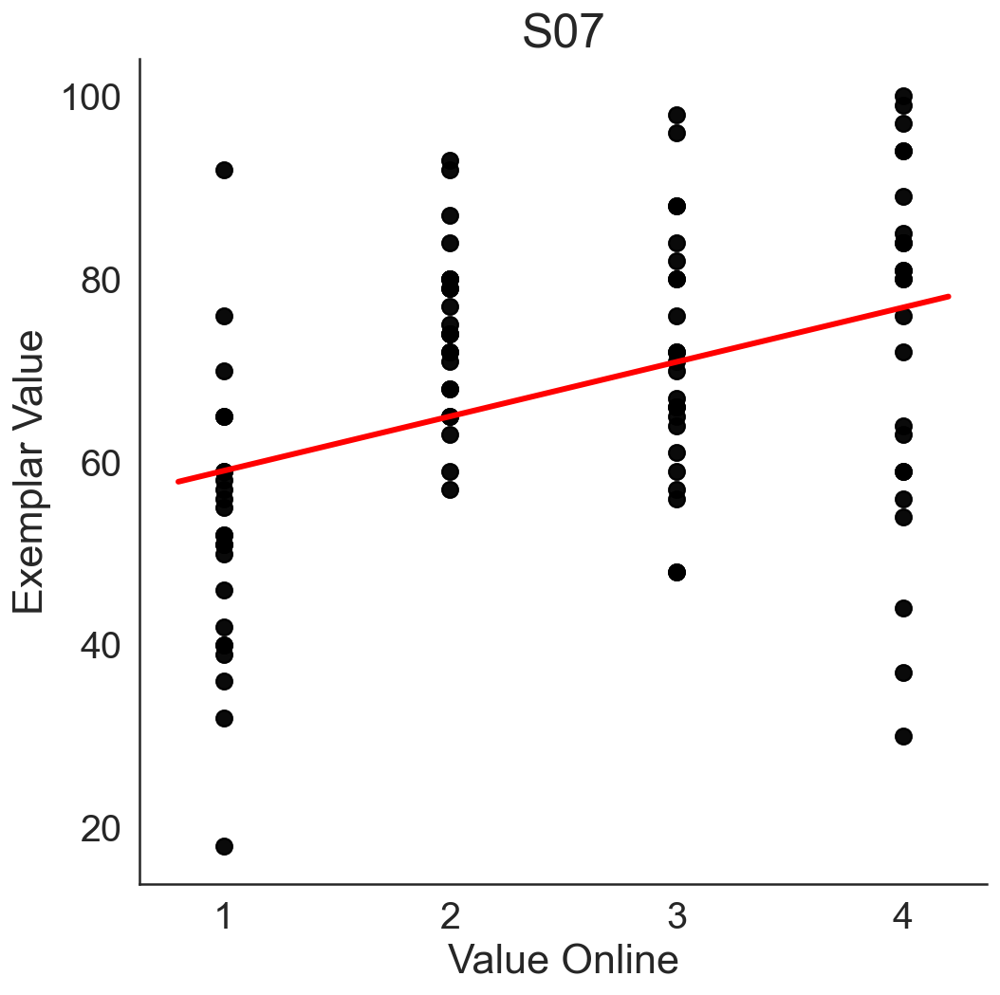

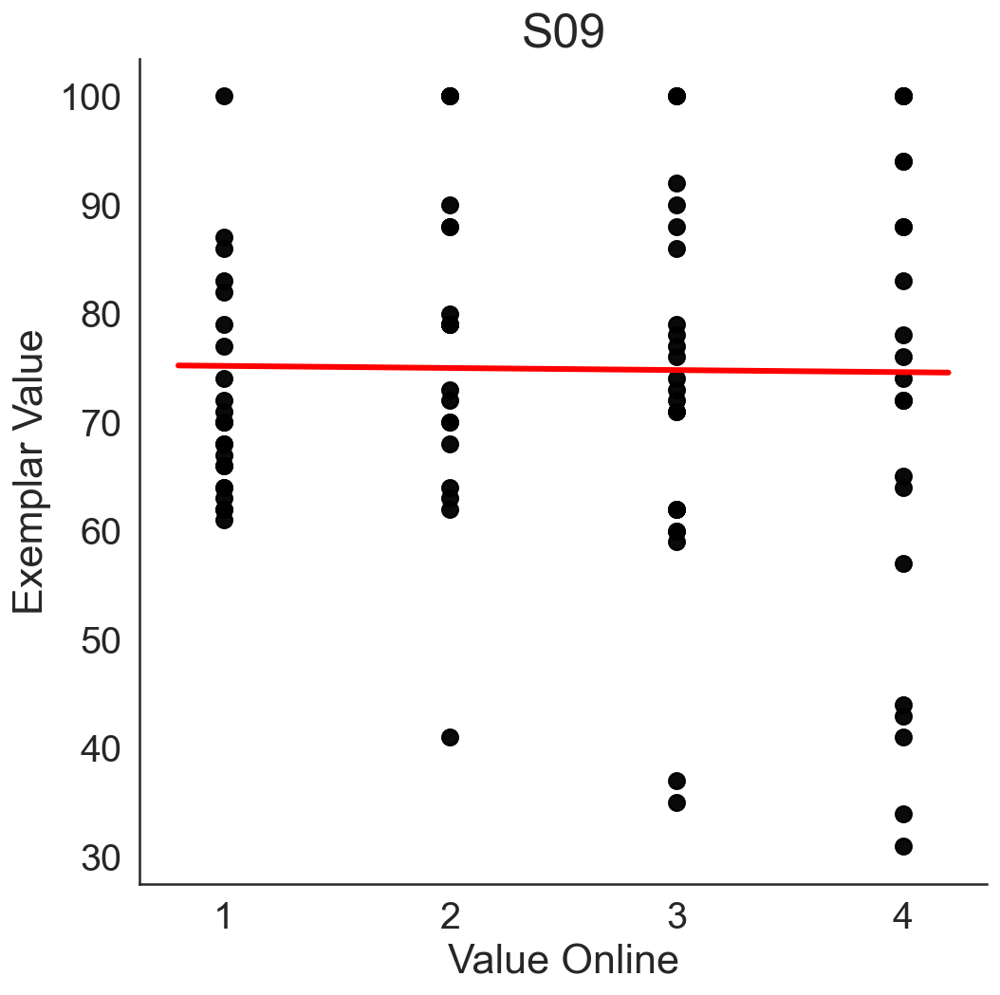

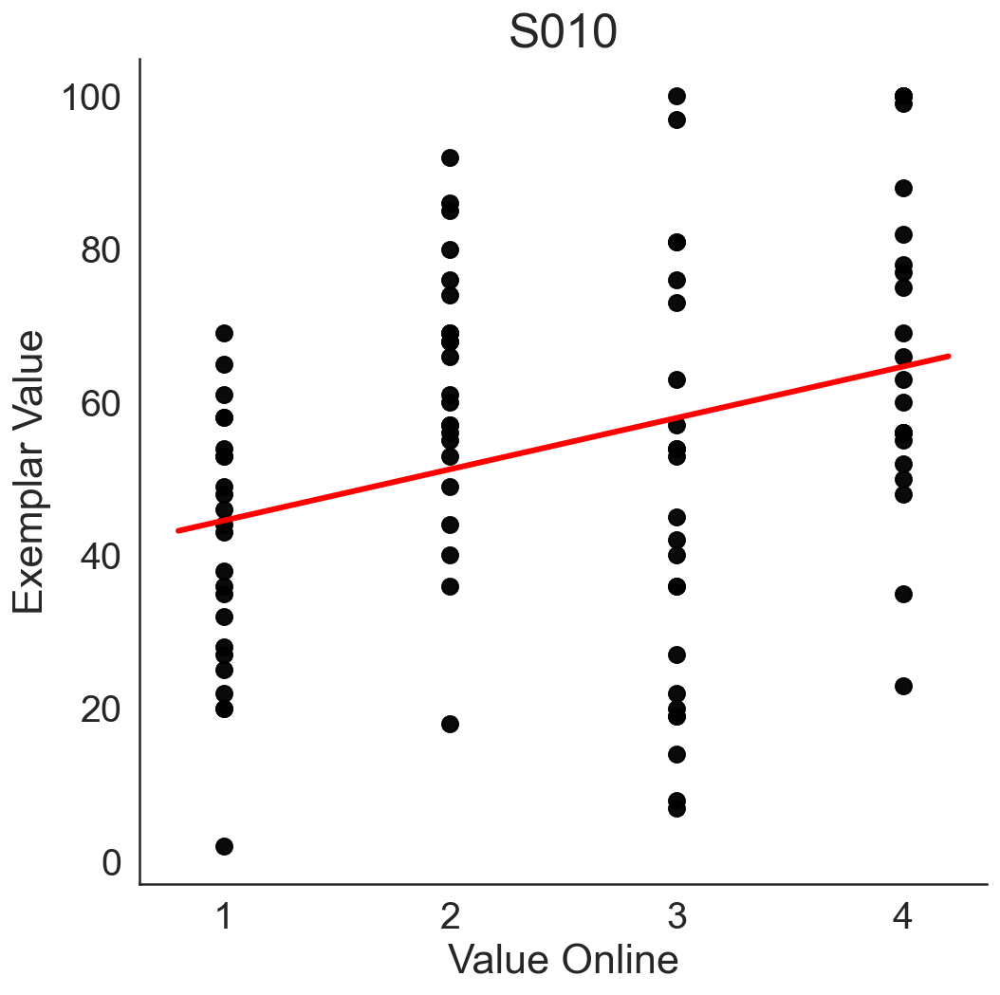

...

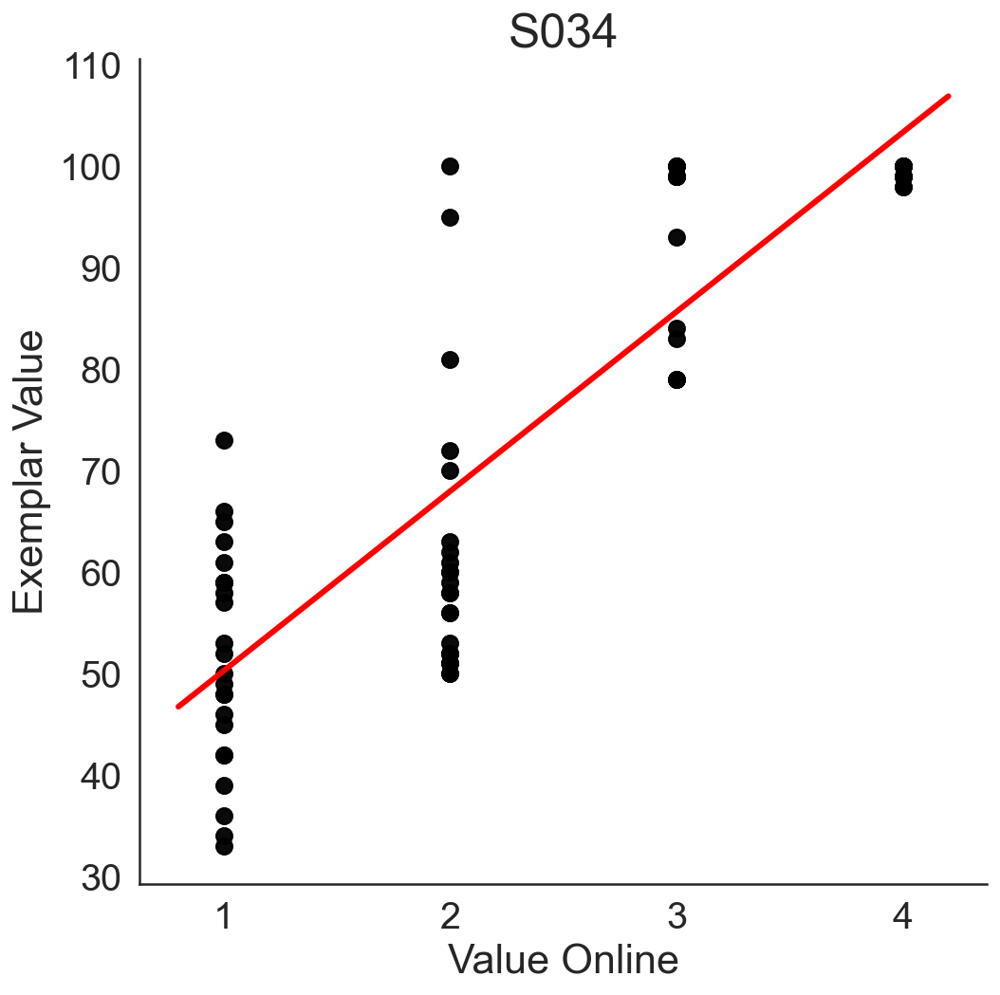

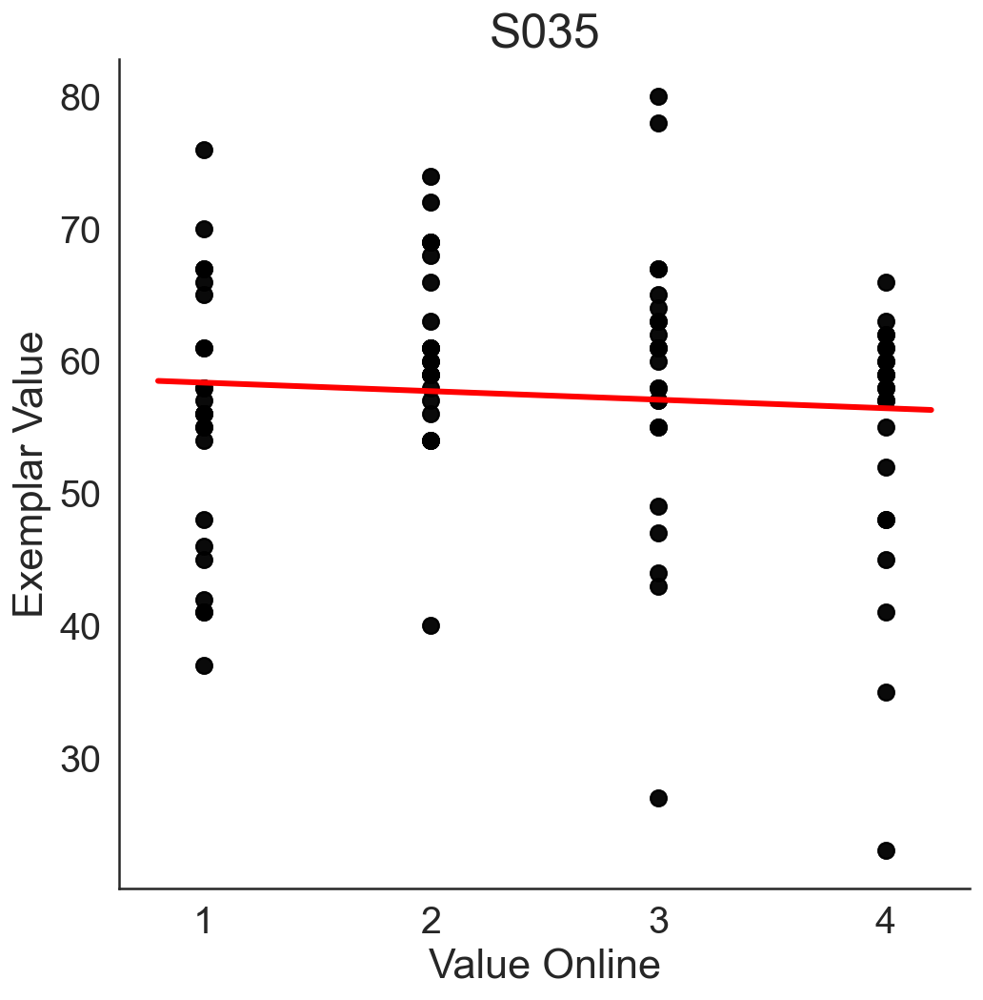

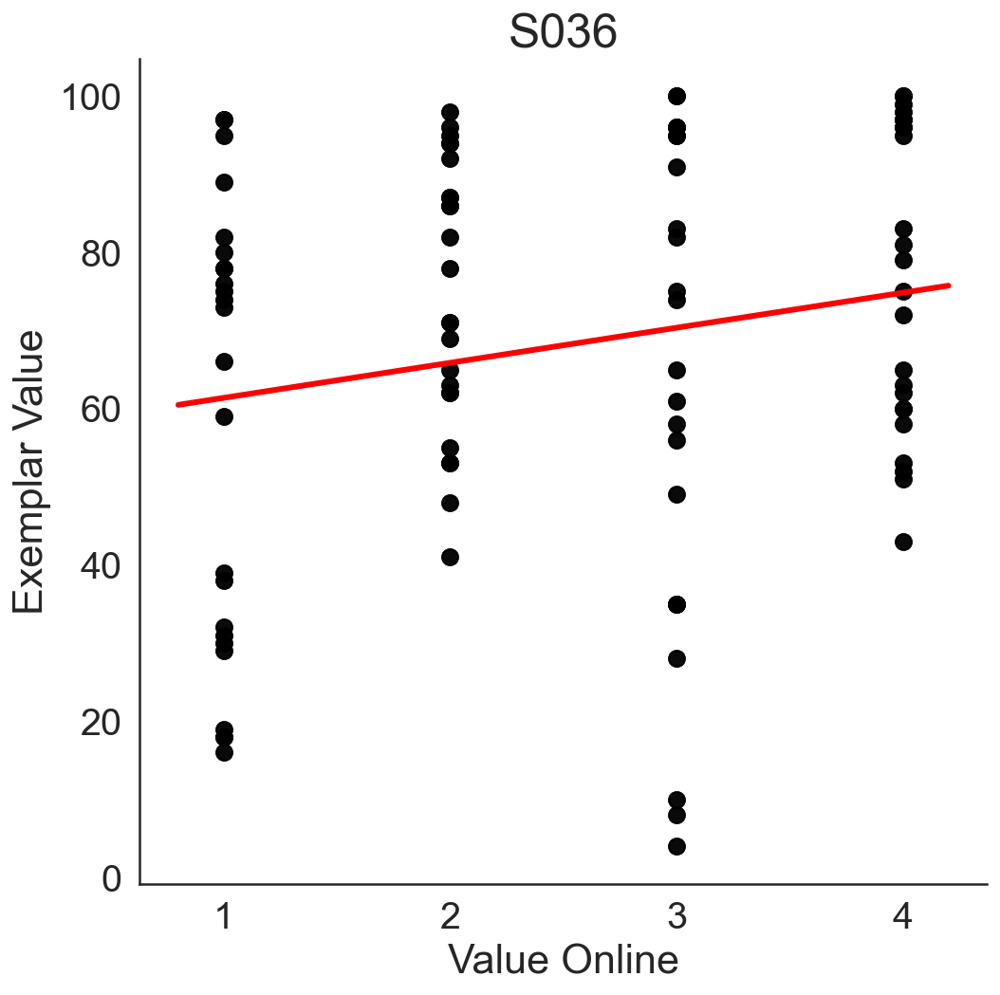

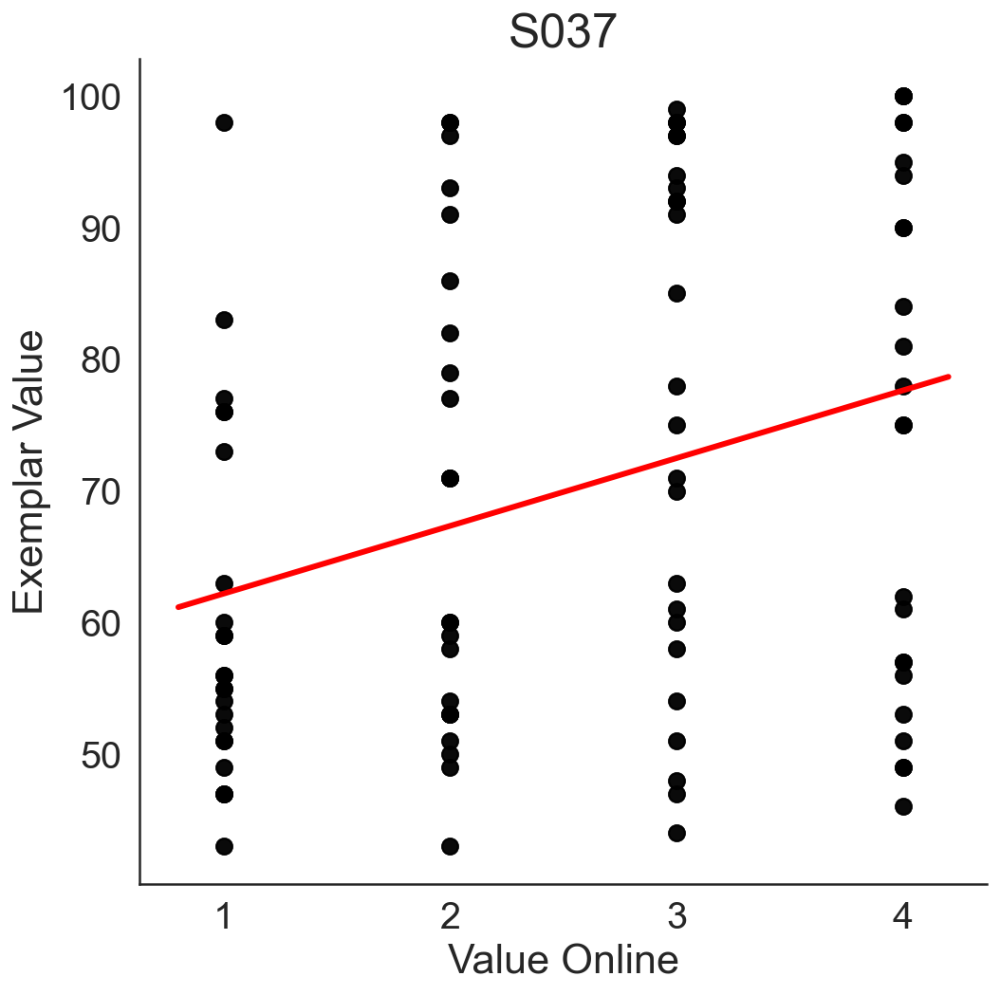

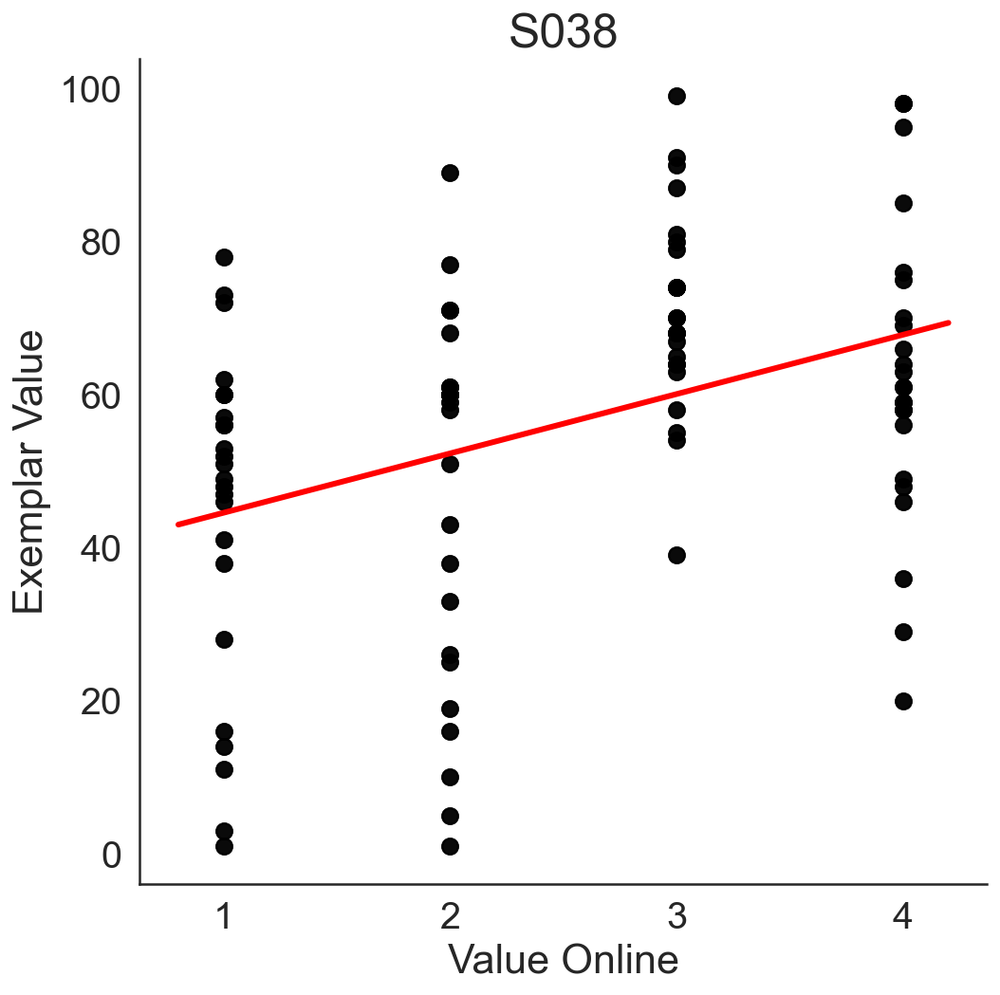

In [30]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
for part in data_exp1["Part"].unique(): 

    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'ValOnl','Value Online','ExVal','Exemplar Value', title = 'S0'+str(part))


# Correlation Overall : Value online vs Value Task

Pearson's r = 0.296 p =  2.3876451676851574e-113


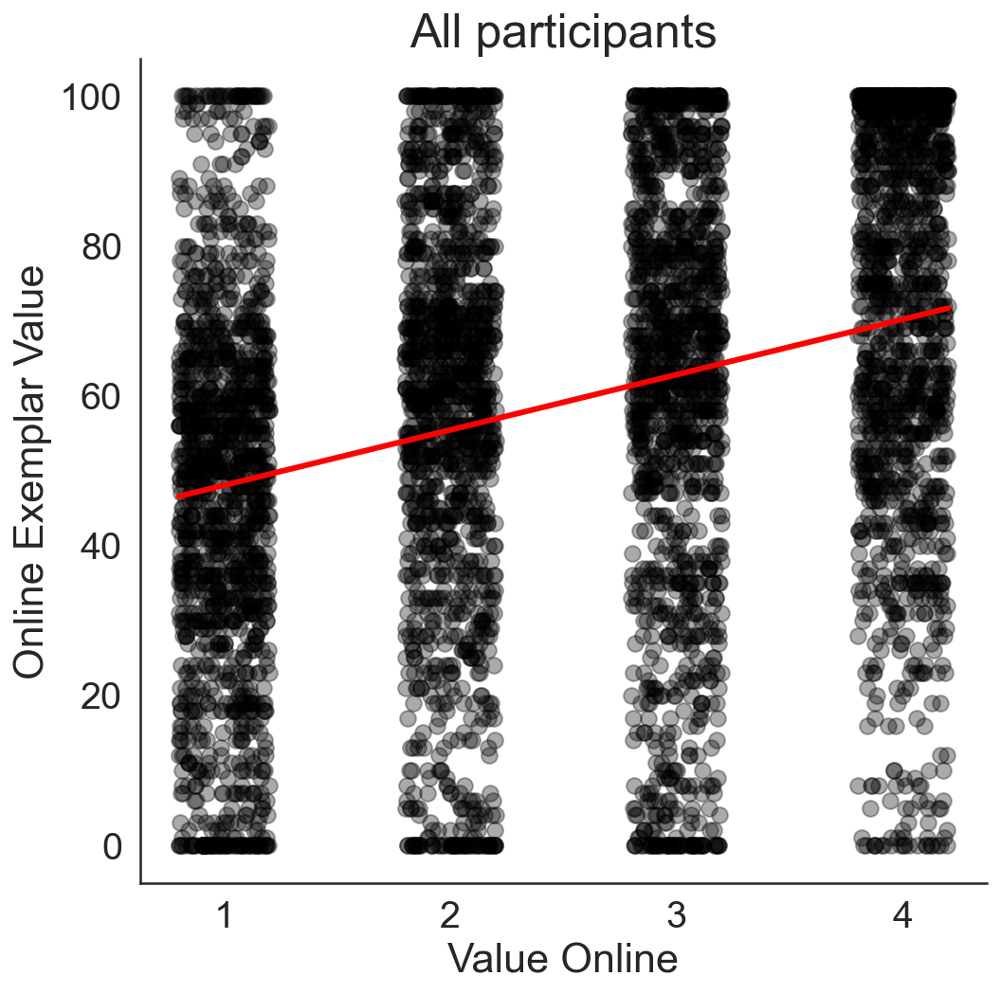

In [31]:
corrPlotSimpleJitter(data_exp_ratings_2, 'ValOnl','Value Online','ExVal','Online Exemplar Value', title = 'All participants')



In [79]:
def violinPlotCompare(data_exp1, x_variable,x_varlabel,y_variable,y_varlabel, title=''):
    
    data_exp1_drop = data_exp1.dropna(subset=[x_variable,y_variable])

    
    vData = pd.DataFrame( columns = ['1','2','3','4'])
    vData['1'] = data_exp1_drop.loc[data_exp1_drop[x_variable] == 1][y_variable].values
    vData['2'] = data_exp1_drop.loc[data_exp1_drop[x_variable] == 2][y_variable].values
    vData['3'] = data_exp1_drop.loc[data_exp1_drop[x_variable] == 3][y_variable].values
    vData['4'] = data_exp1_drop.loc[data_exp1_drop[x_variable] == 4][y_variable].values

    
    
    my_pal = {"1":"#0A6A4C" ,"2":"#0A6A4C","3":"#0A6A4C","4":"#0A6A4C"}
    bplot = sns.violinplot(data=vData[['1','2','3','4']],palette=my_pal)
    bplot.set(ylabel=y_varlabel, xlabel=x_varlabel)
    
    for violin, alpha in zip(bplot.collections[::2], [0.25,0.5,0.75,1]):
        violin.set_alpha(alpha)

    sns.despine()

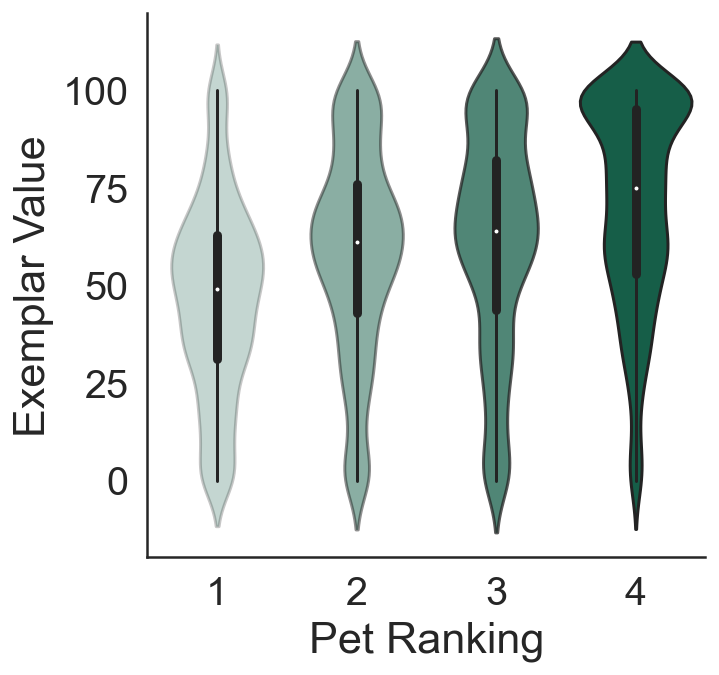

In [80]:
violinPlotCompare(data_exp_ratings_2, 'ValOnl','Pet Ranking','ExVal','Exemplar Value', title = 'All participants')

### Compare Value Rating Like (in task) vs Value Online

Pearson's r = 0.905 p =  0.0
Pearson's r = 0.964 p =  0.0
Pearson's r = 0.917 p =  0.0
Pearson's r = 0.878 p =  0.0
Pearson's r = 0.845 p =  0.0
Pearson's r = 0.99 p =  0.0
Pearson's r = 0.929 p =  0.0
Pearson's r = 0.926 p =  0.0
Pearson's r = 0.937 p =  0.0
Pearson's r = 0.951 p =  0.0
Pearson's r = 0.968 p =  0.0
Pearson's r = 0.894 p =  0.0
Pearson's r = 0.781 p =  0.0
Pearson's r = 0.877 p =  0.0
Pearson's r = 0.83 p =  0.0
Pearson's r = 0.85 p =  0.0
Pearson's r = 0.91 p =  0.0
Pearson's r = 0.698 p =  0.0
Pearson's r = 0.811 p =  0.0
Pearson's r = 0.824 p =  0.0
Pearson's r = 0.944 p =  0.0
Pearson's r = 0.775 p =  0.0
Pearson's r = 0.944 p =  0.0
Pearson's r = 0.935 p =  0.0


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Pearson's r = 0.937 p =  0.0
Pearson's r = 0.992 p =  0.0
Pearson's r = -0.949 p =  0.0
Pearson's r = 0.933 p =  0.0
Pearson's r = 0.8 p =  0.0


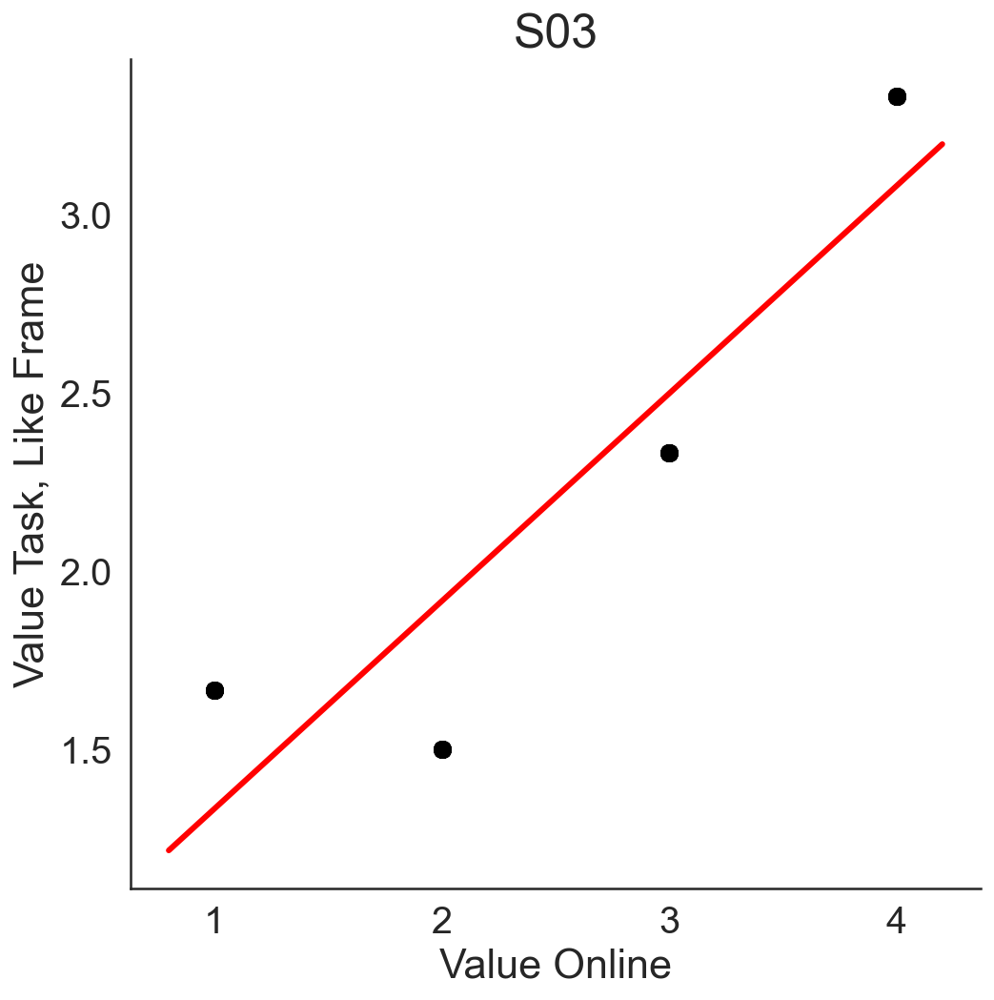

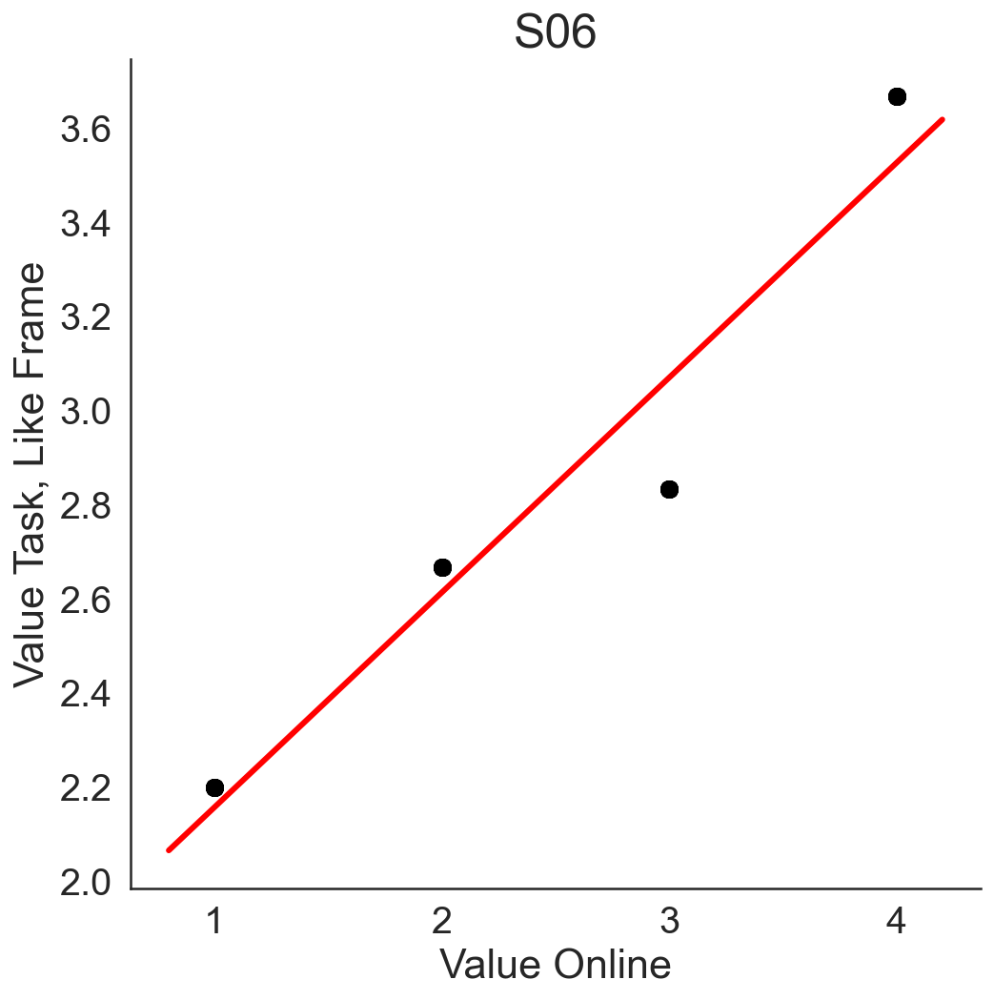

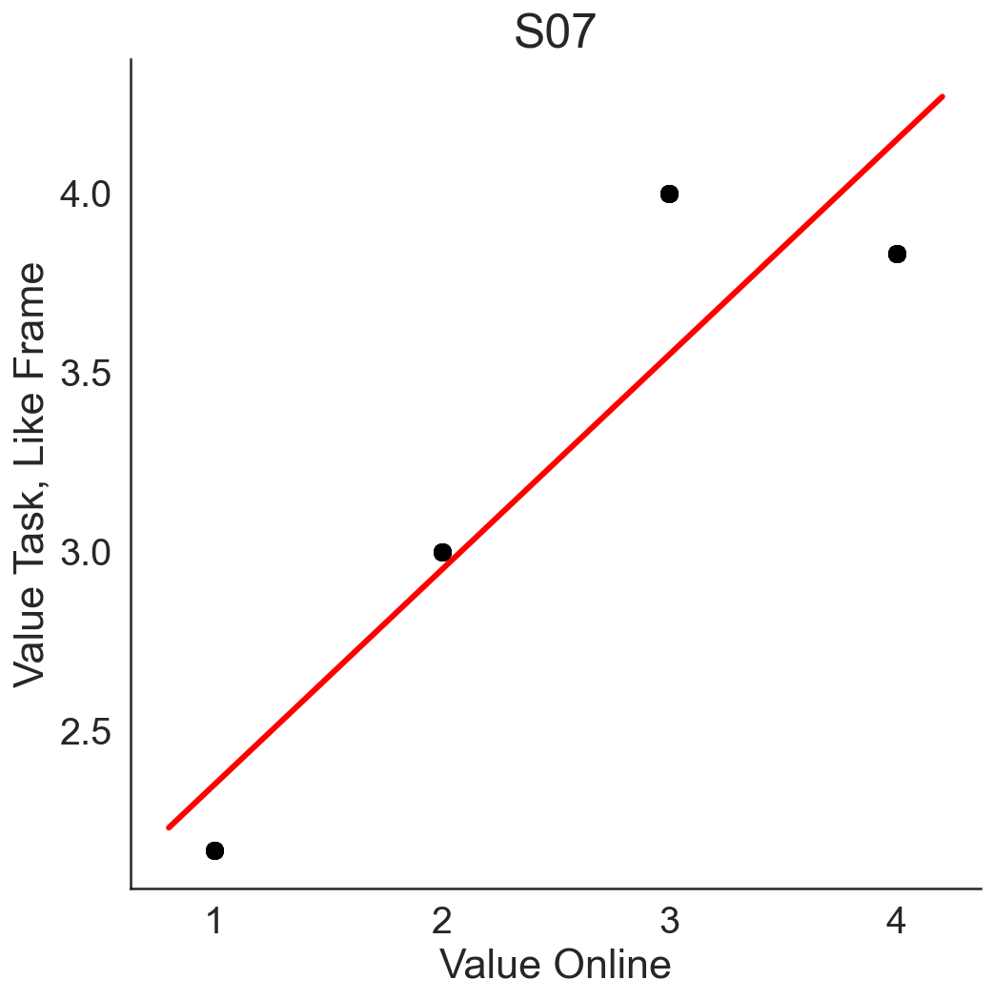

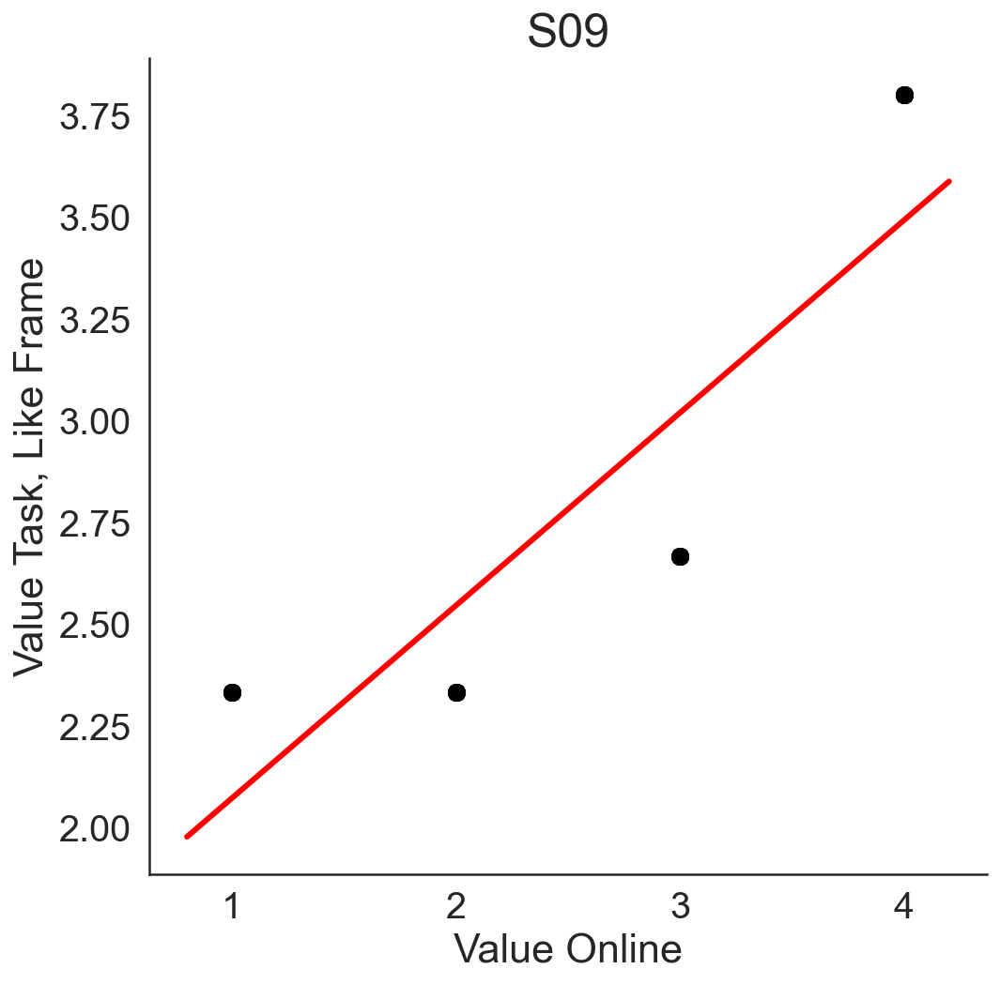

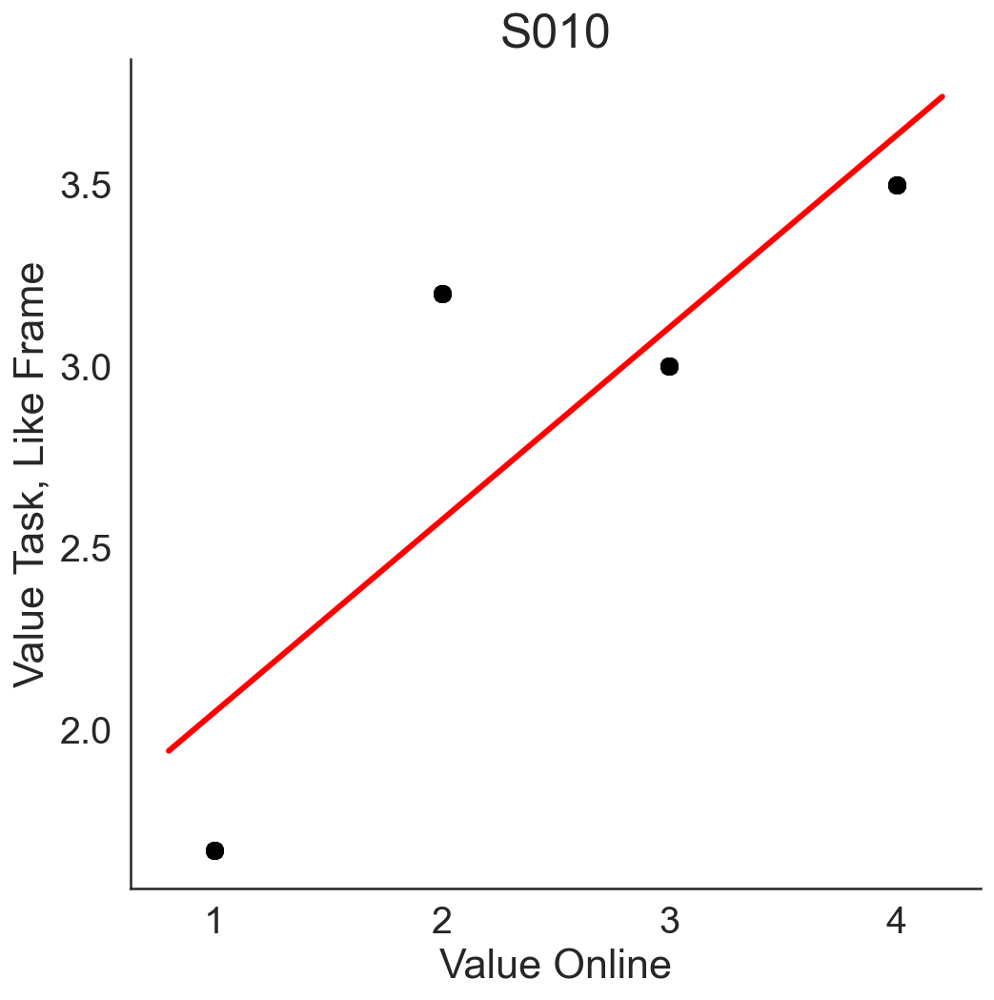

...

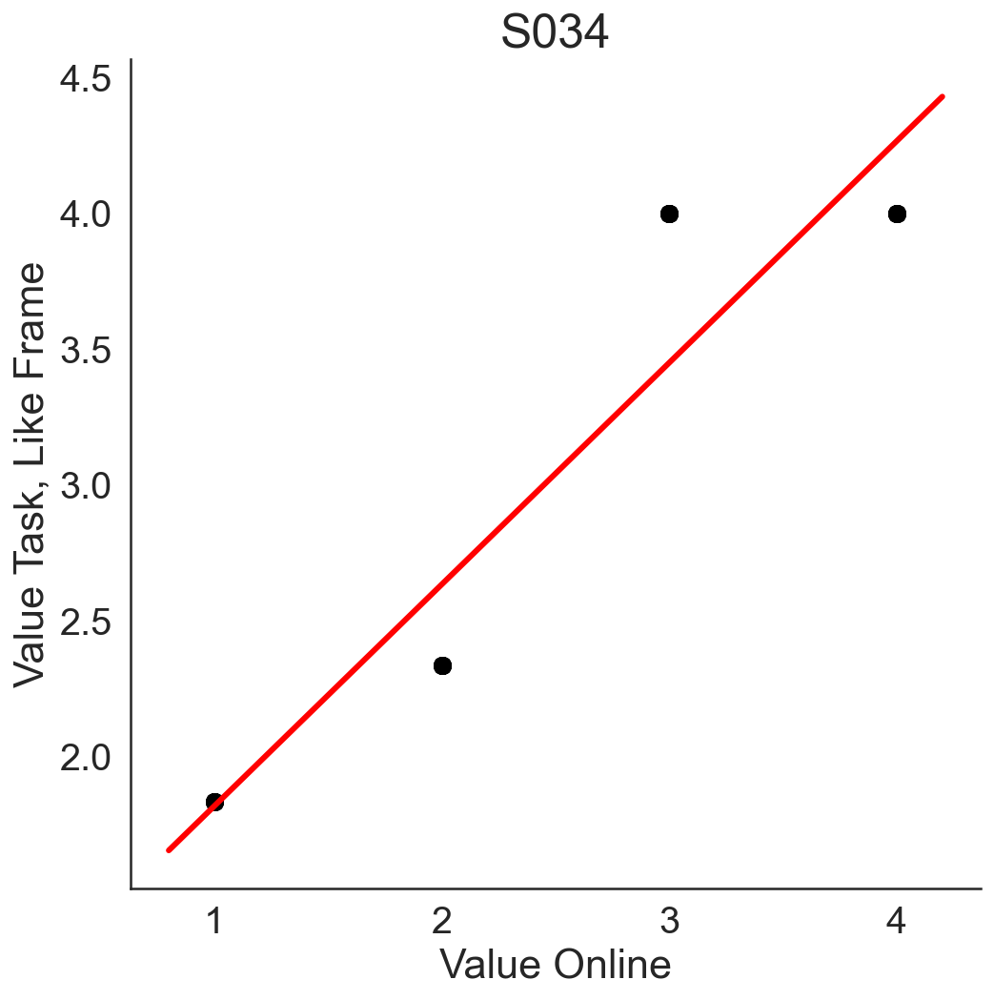

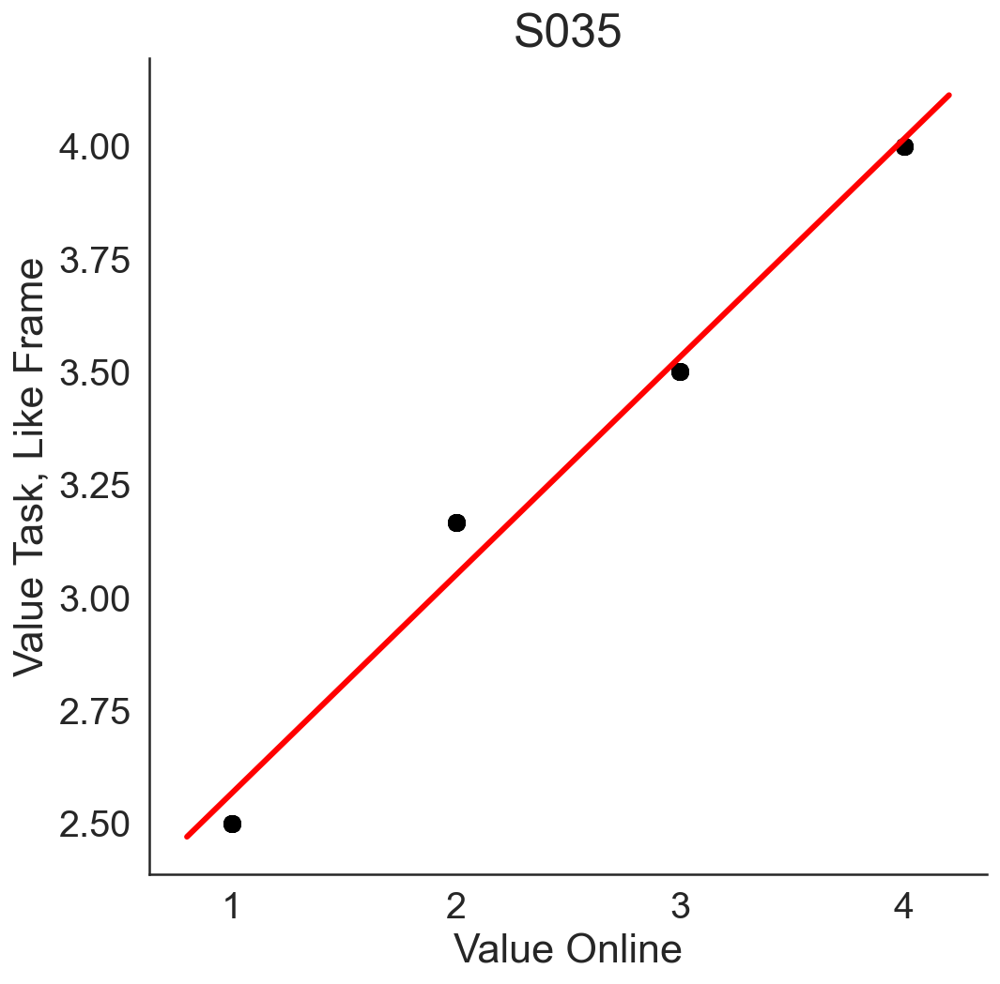

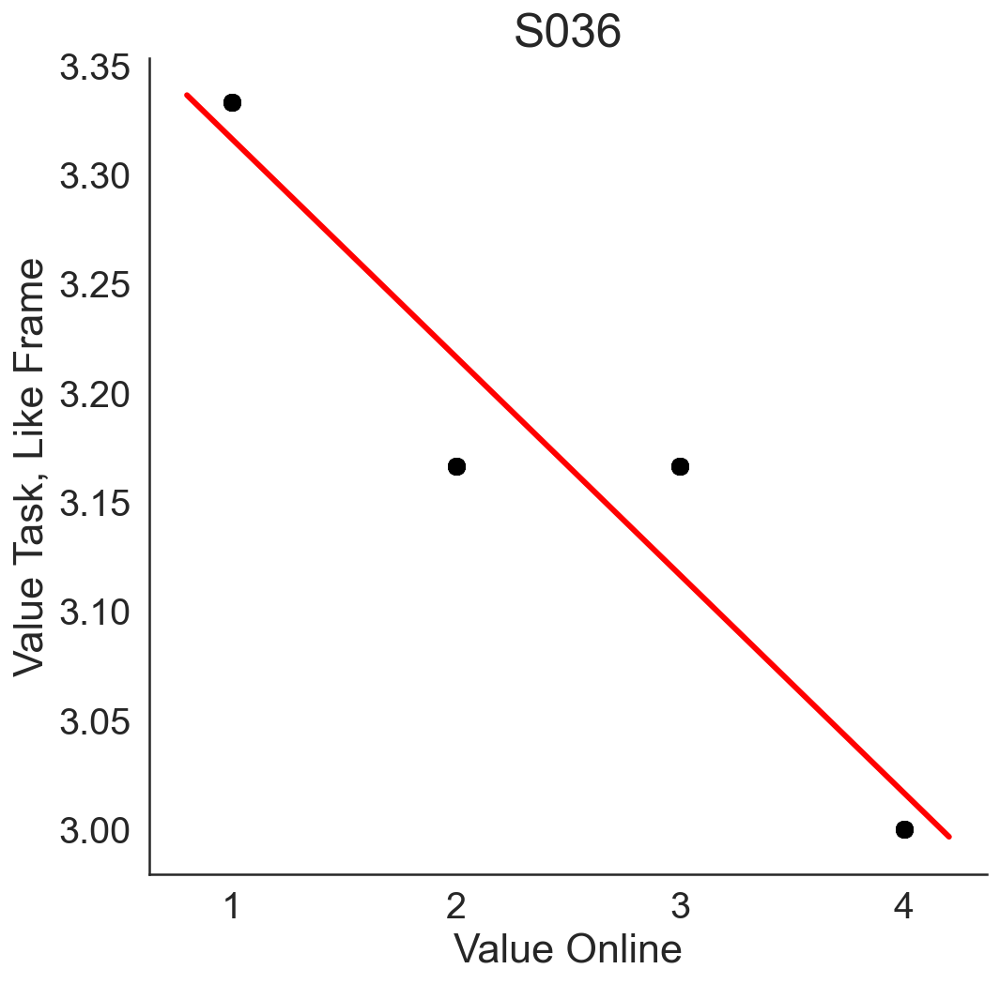

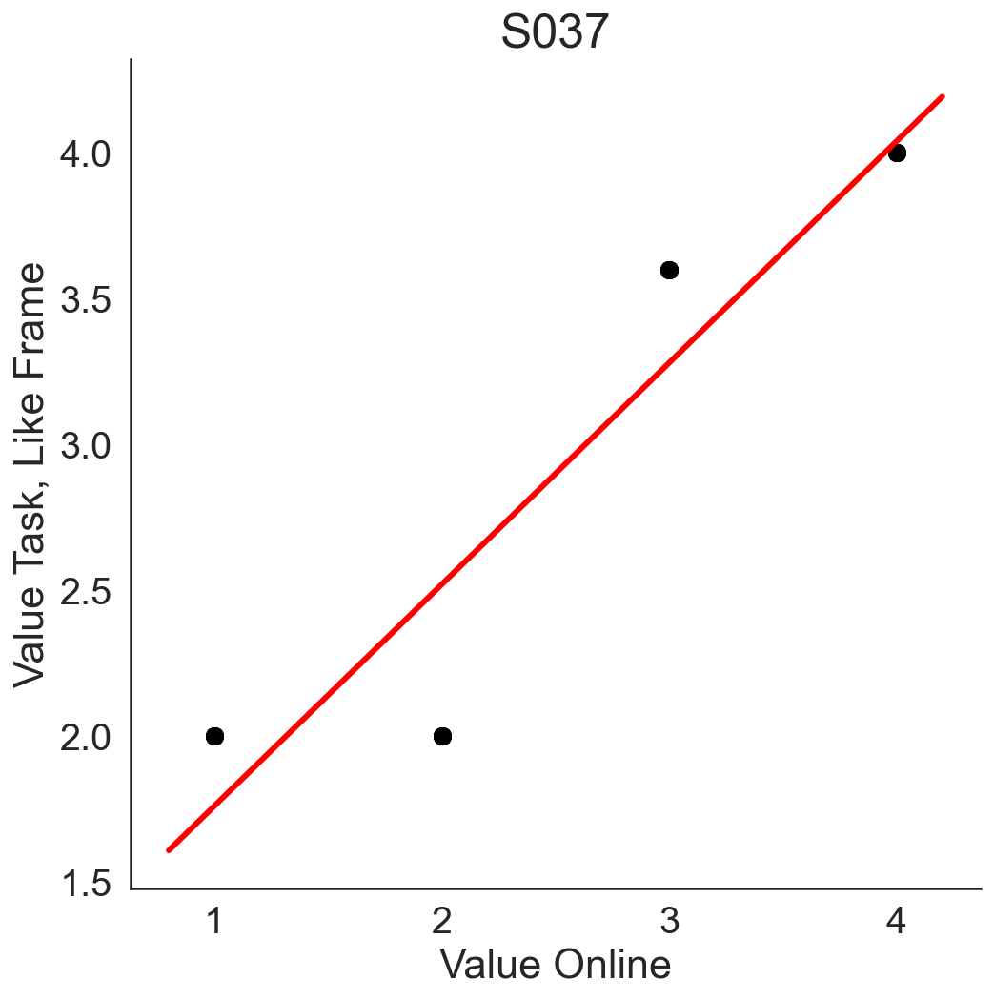

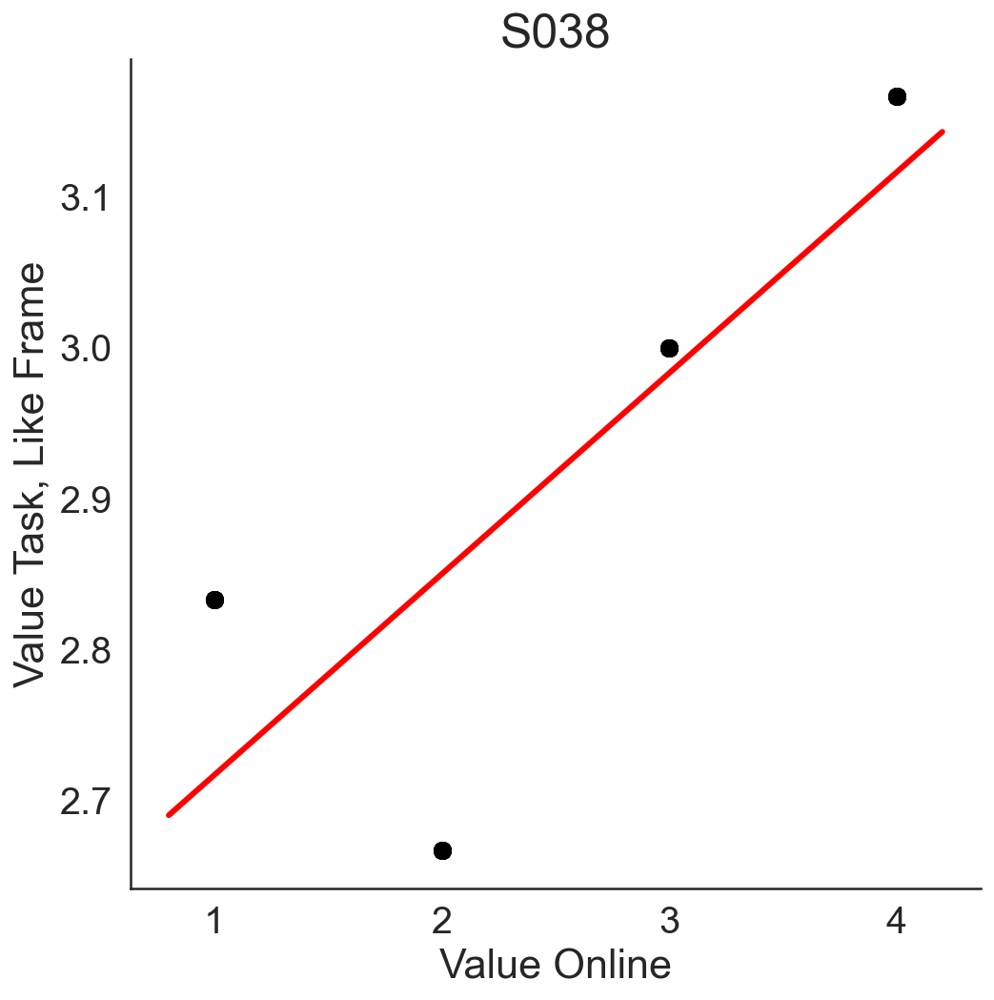

In [29]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
for part in data_exp1["Part"].unique(): 

    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'ValOnl','Value Online','Val1','Value Task, Like Frame', title = 'S0'+str(part))


# Correlation Overall : Value online vs Value Task

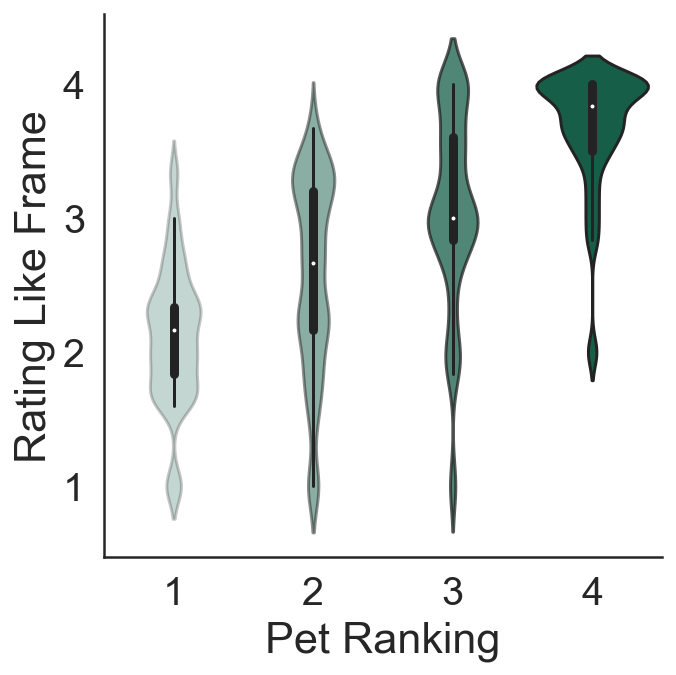

In [81]:
violinPlotCompare(data_exp_ratings_2, 'ValOnl','Pet Ranking','Val1','Rating Like Frame', title = 'All participants')

Pearson's r = 0.68 p =  0.0


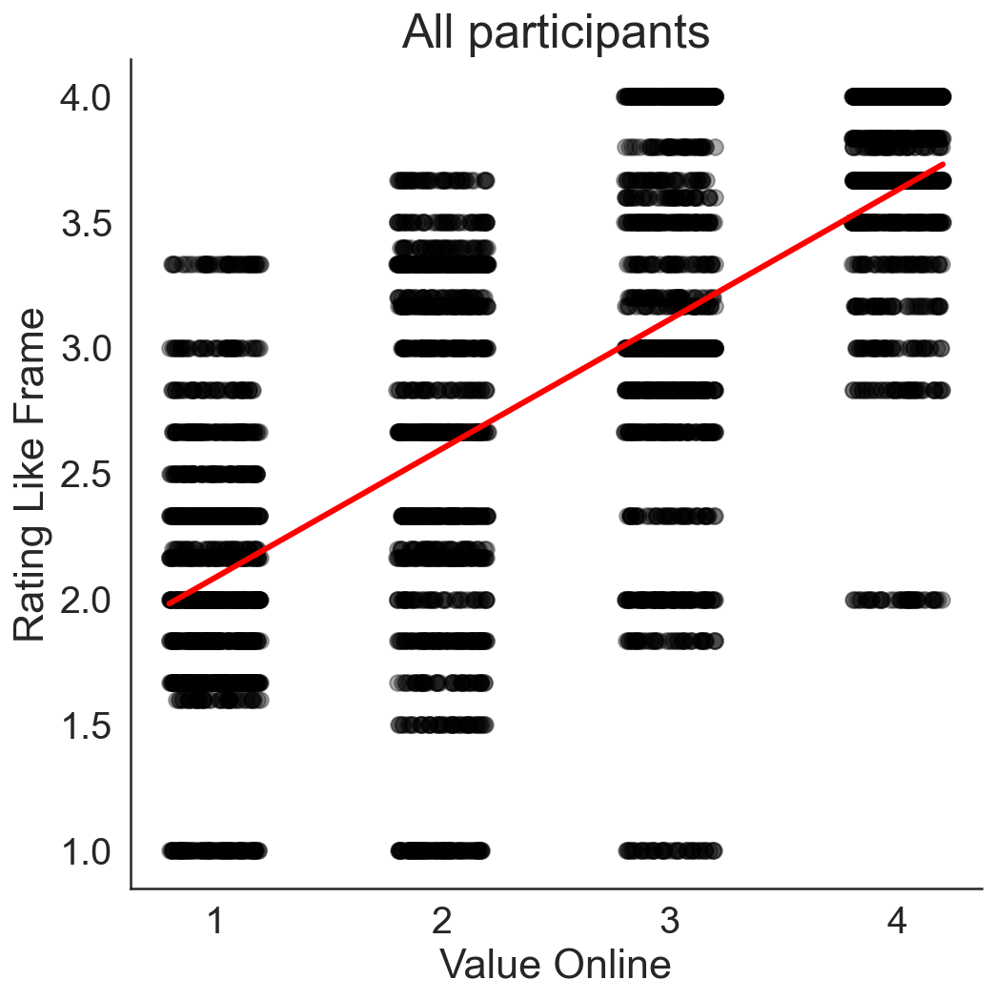

In [74]:
corrPlotSimpleJitter(data_exp_ratings_2, 'ValOnl','Value Online','Val1','Rating Like Frame', title = 'All participants')

### Compare Value Rating Dislike (in task) vs Value Online

Pearson's r = -0.858 p =  0.0
Pearson's r = -0.978 p =  0.0
Pearson's r = -0.865 p =  0.0
Pearson's r = -0.992 p =  0.0
Pearson's r = -0.868 p =  0.0
Pearson's r = -0.939 p =  0.0
Pearson's r = -0.218 p =  0.002
Pearson's r = 0.467 p =  0.0
Pearson's r = -0.837 p =  0.0
Pearson's r = -0.834 p =  0.0
Pearson's r = -0.844 p =  0.0
Pearson's r = -0.929 p =  0.0
Pearson's r = -0.632 p =  0.0
Pearson's r = 0.363 p =  0.0
Pearson's r = -0.852 p =  0.0
Pearson's r = -0.607 p =  0.0
Pearson's r = -0.847 p =  0.0
Pearson's r = -0.837 p =  0.0
Pearson's r = -0.923 p =  0.0
Pearson's r = -0.956 p =  0.0
Pearson's r = -0.979 p =  0.0
Pearson's r = -0.759 p =  0.0


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Pearson's r = -0.698 p =  0.0
Pearson's r = -0.908 p =  0.0
Pearson's r = -0.844 p =  0.0
Pearson's r = 0.674 p =  0.0
Pearson's r = -0.757 p =  0.0
Pearson's r = -0.72 p =  0.0
Pearson's r = 0.643 p =  0.0


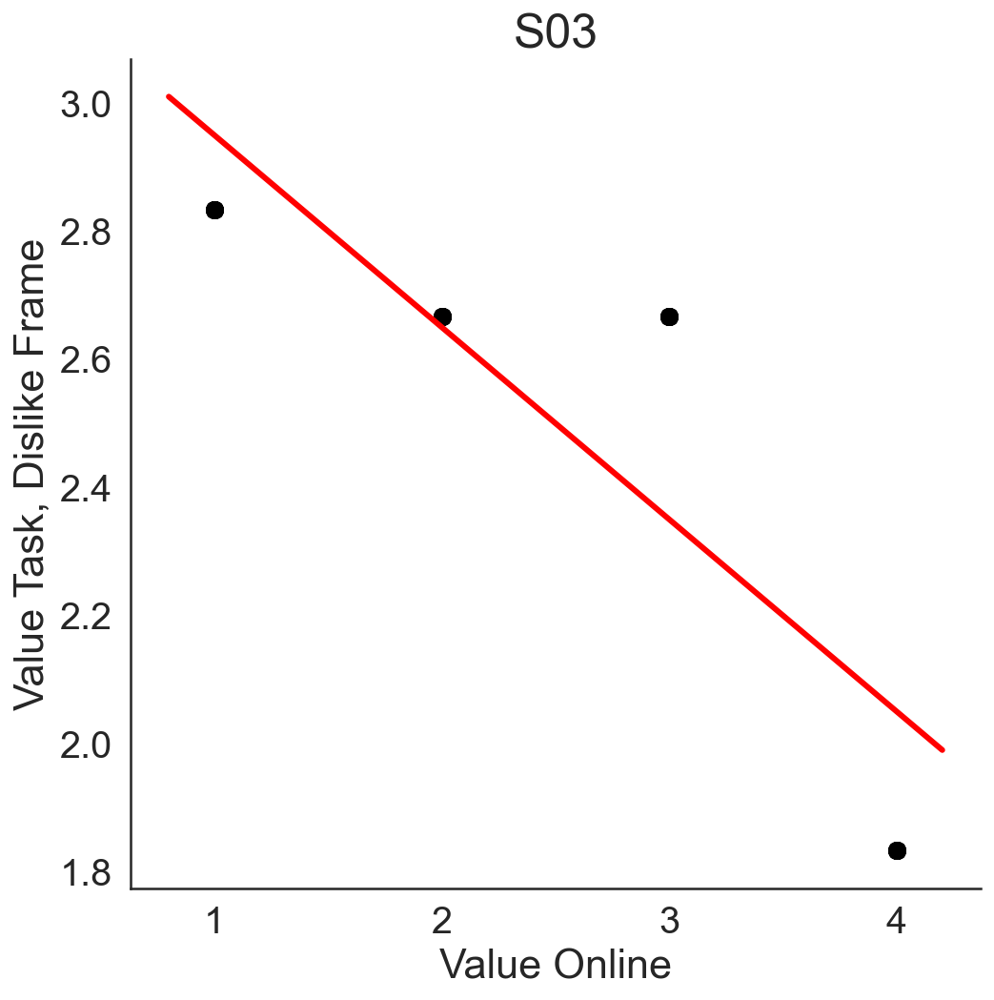

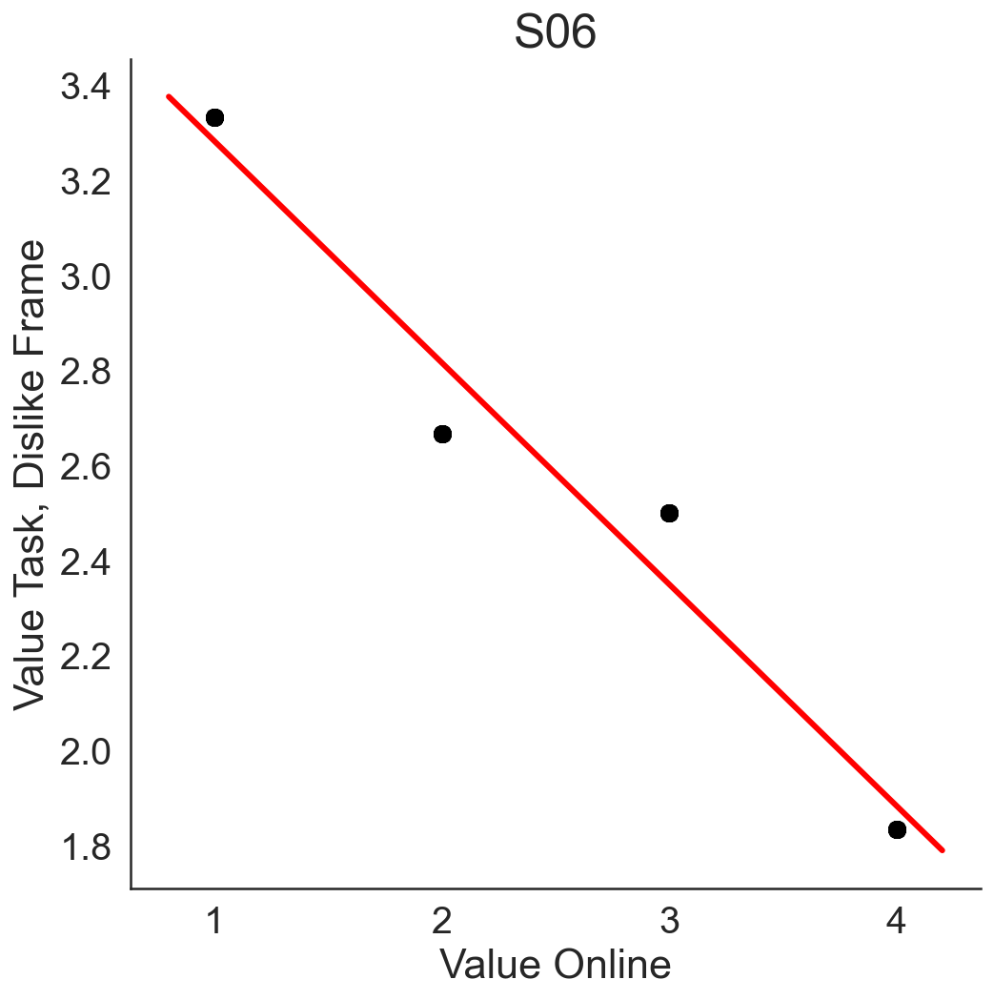

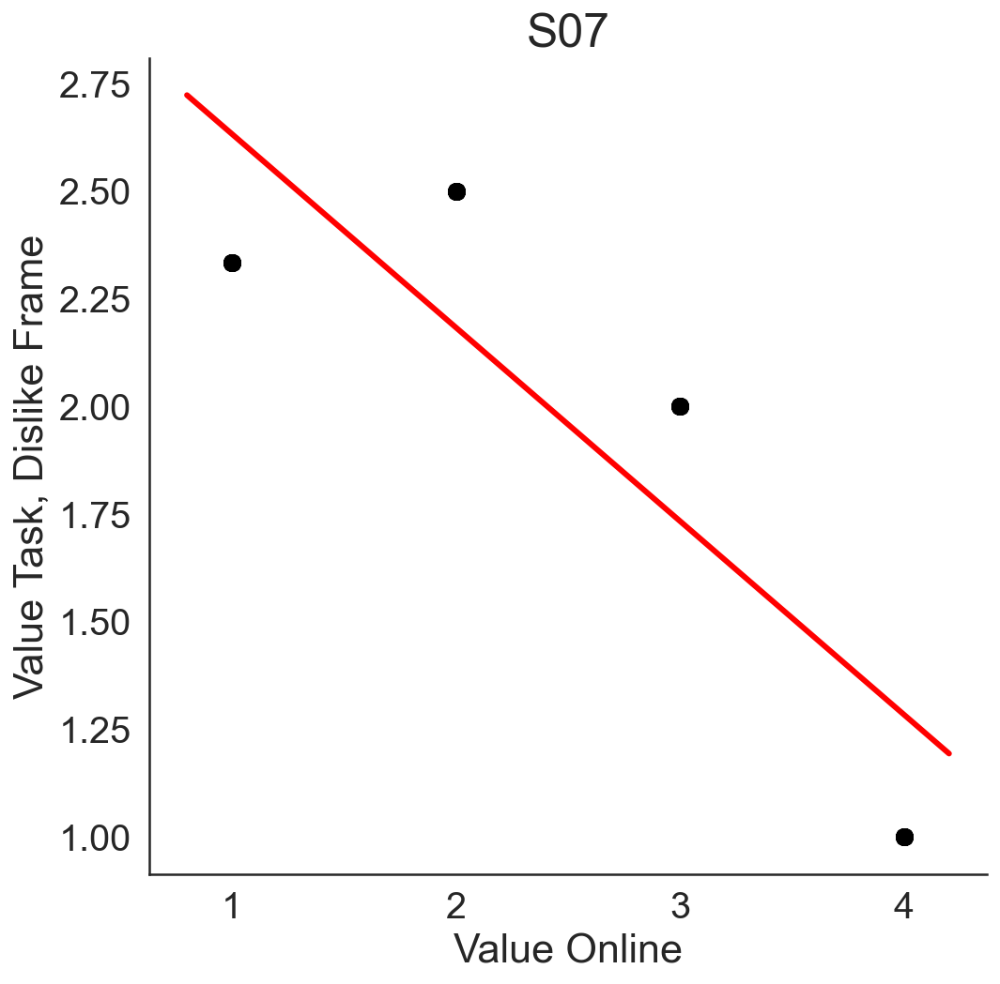

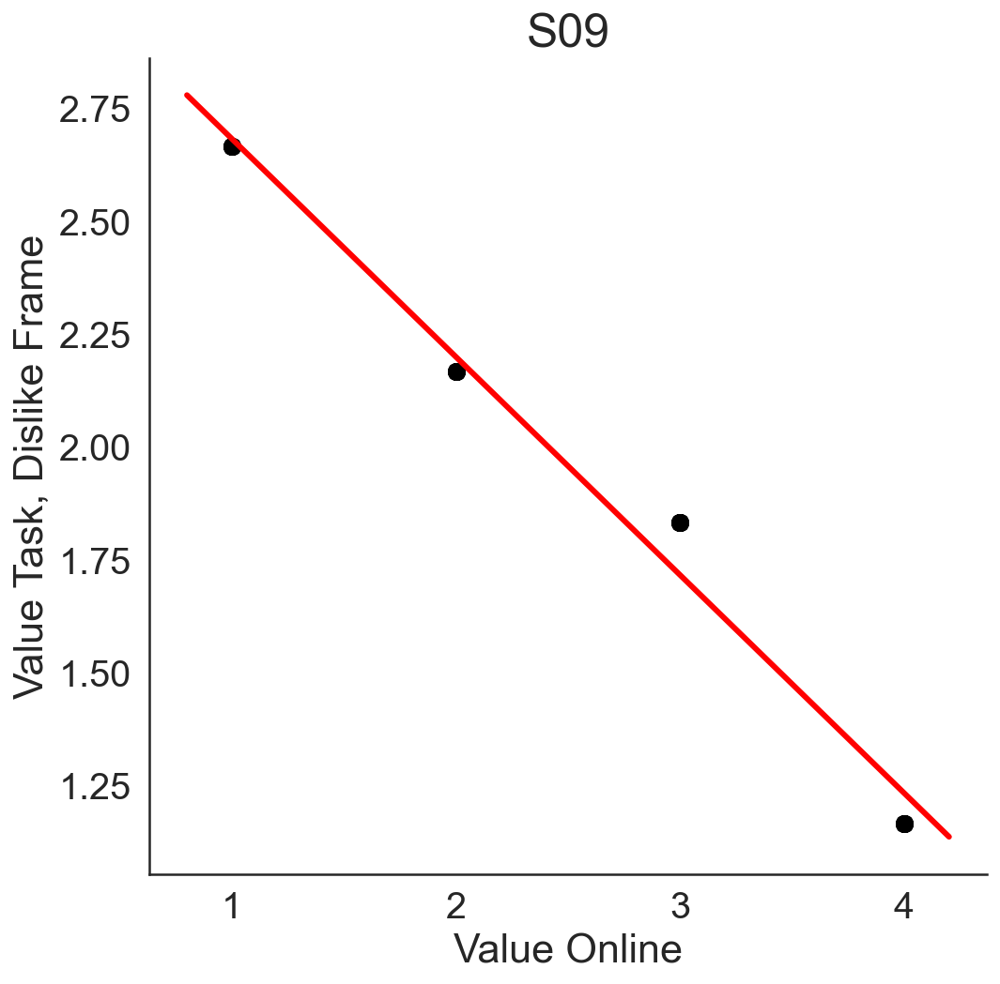

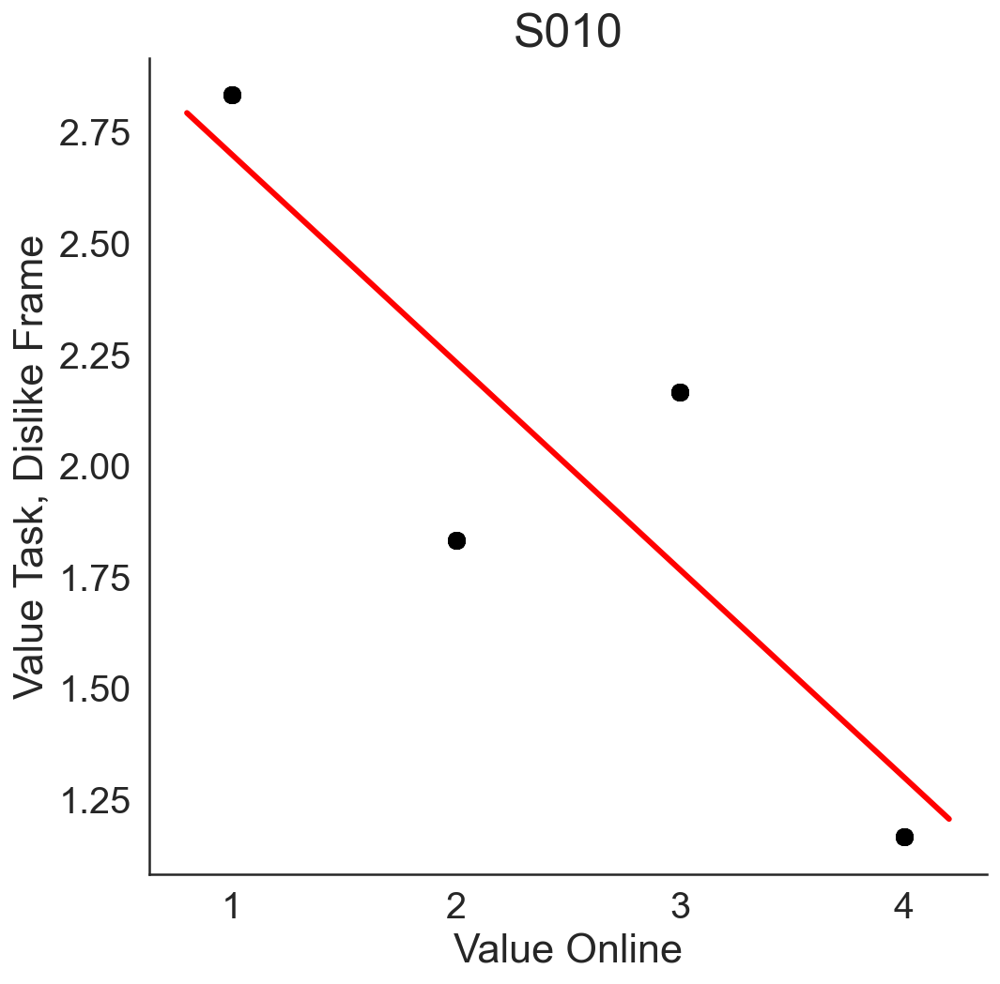

...

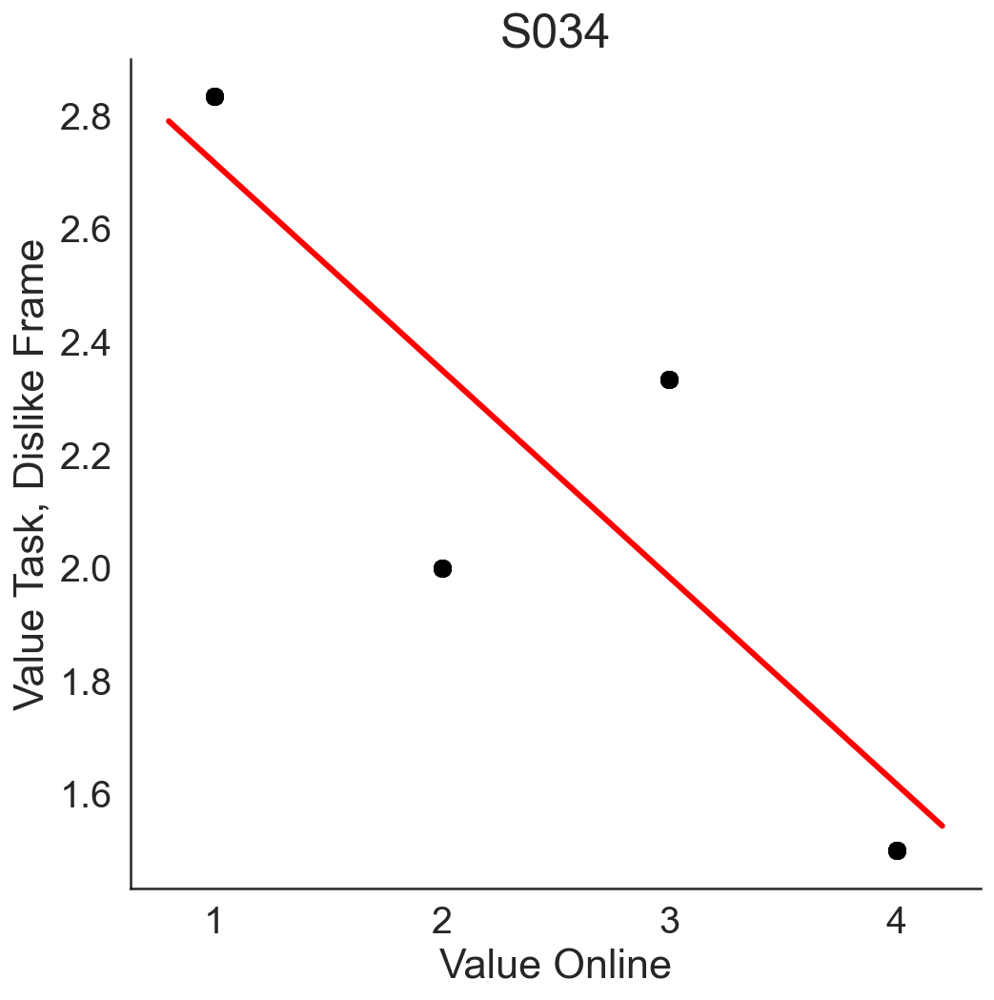

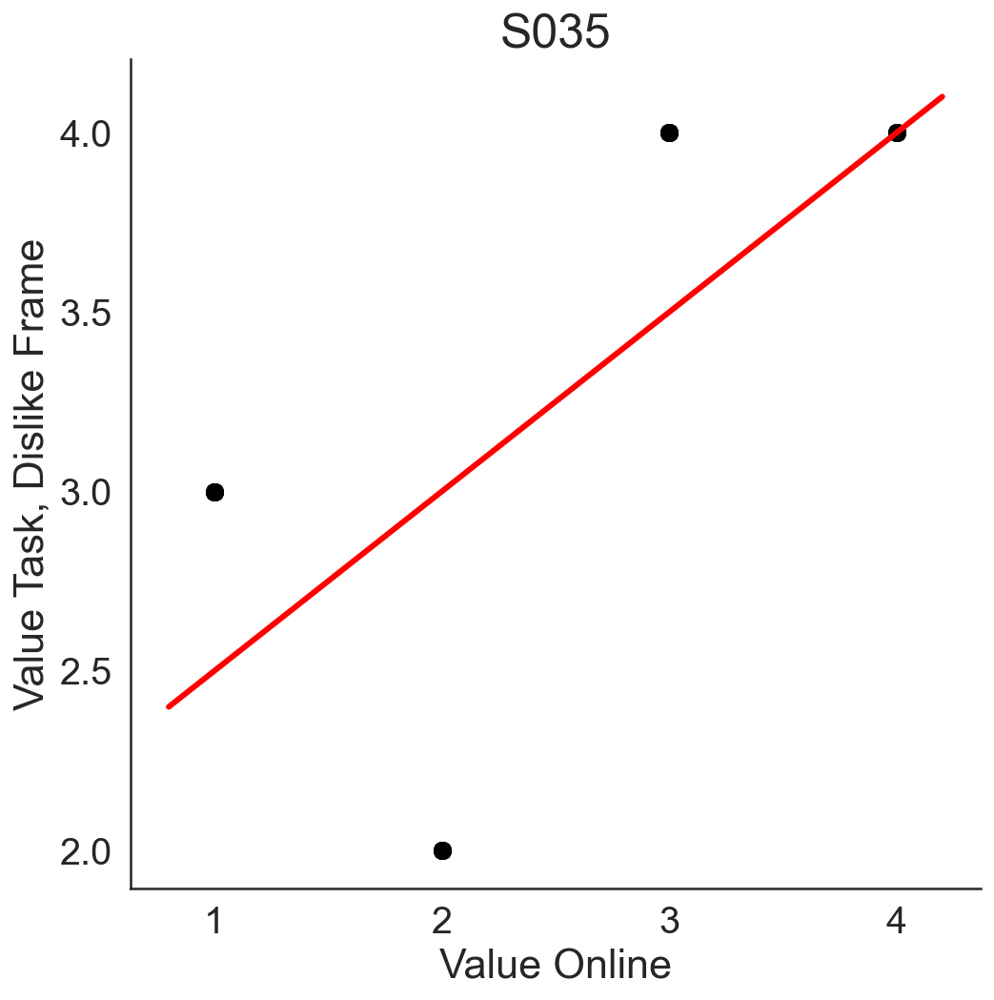

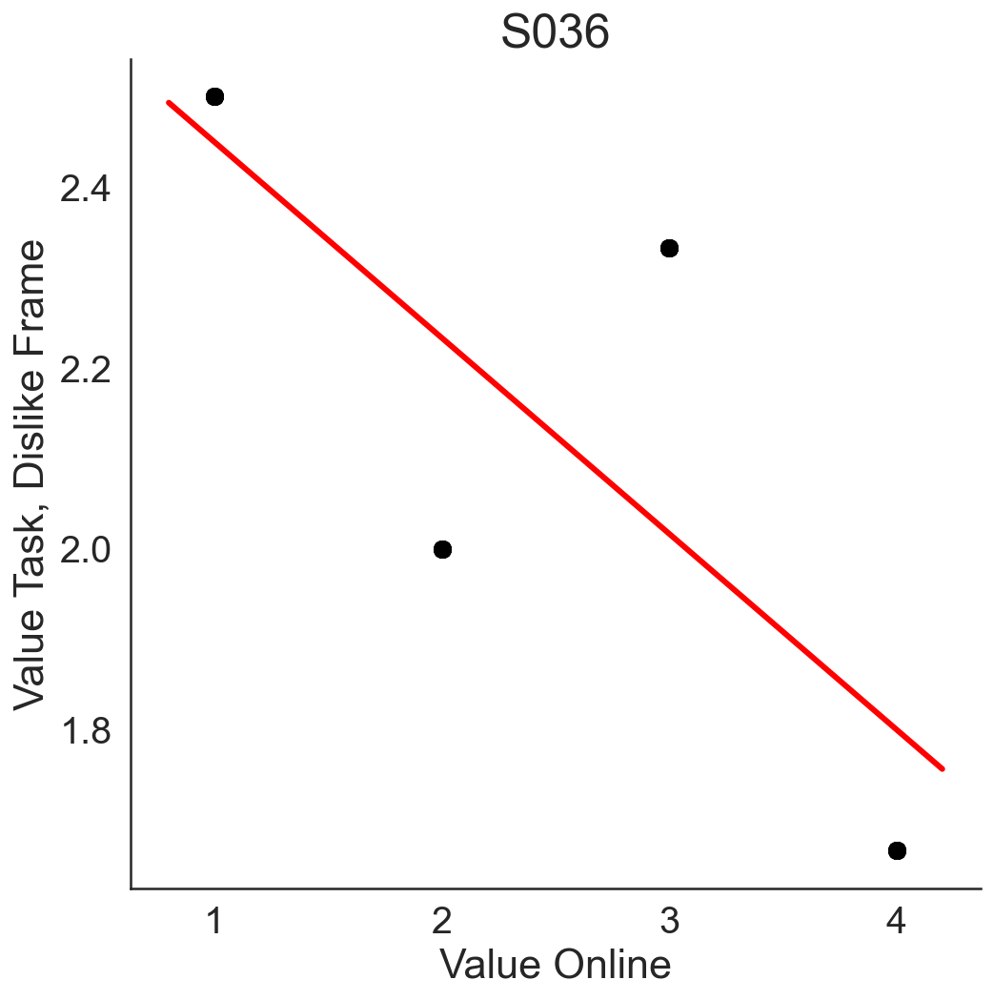

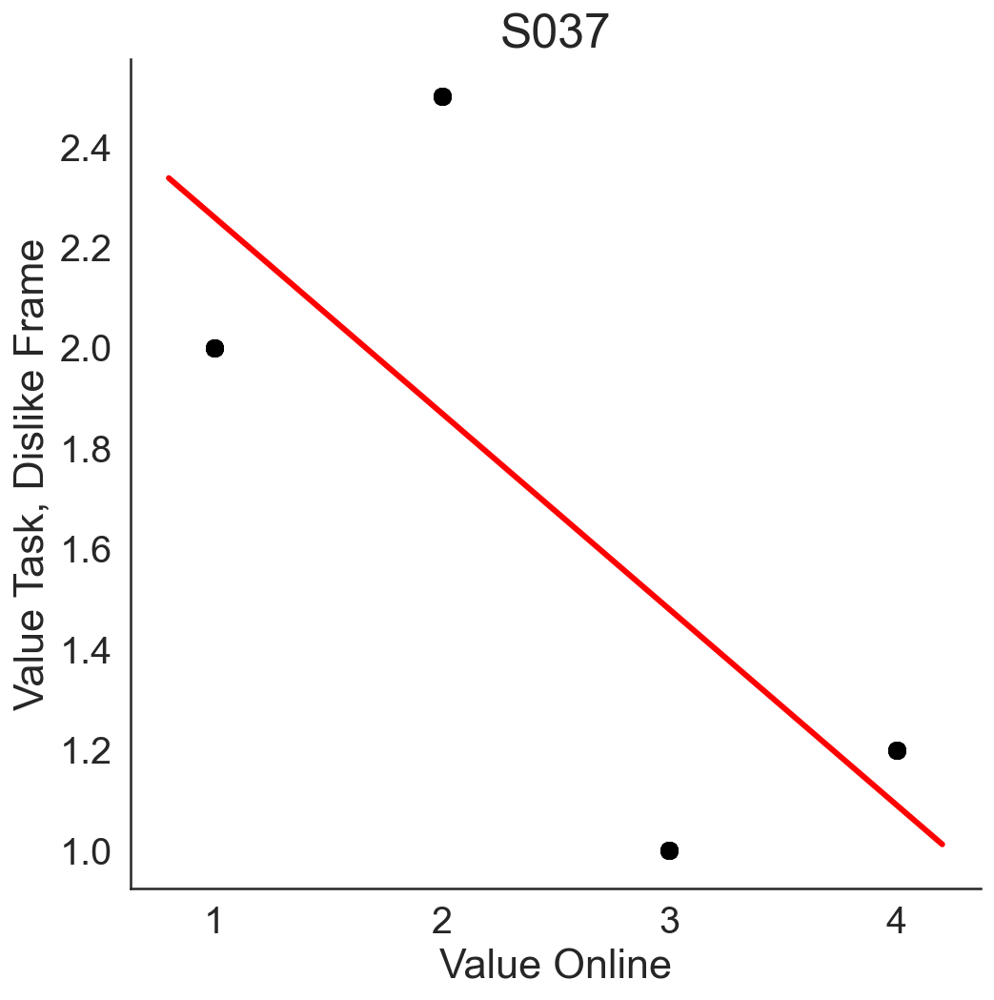

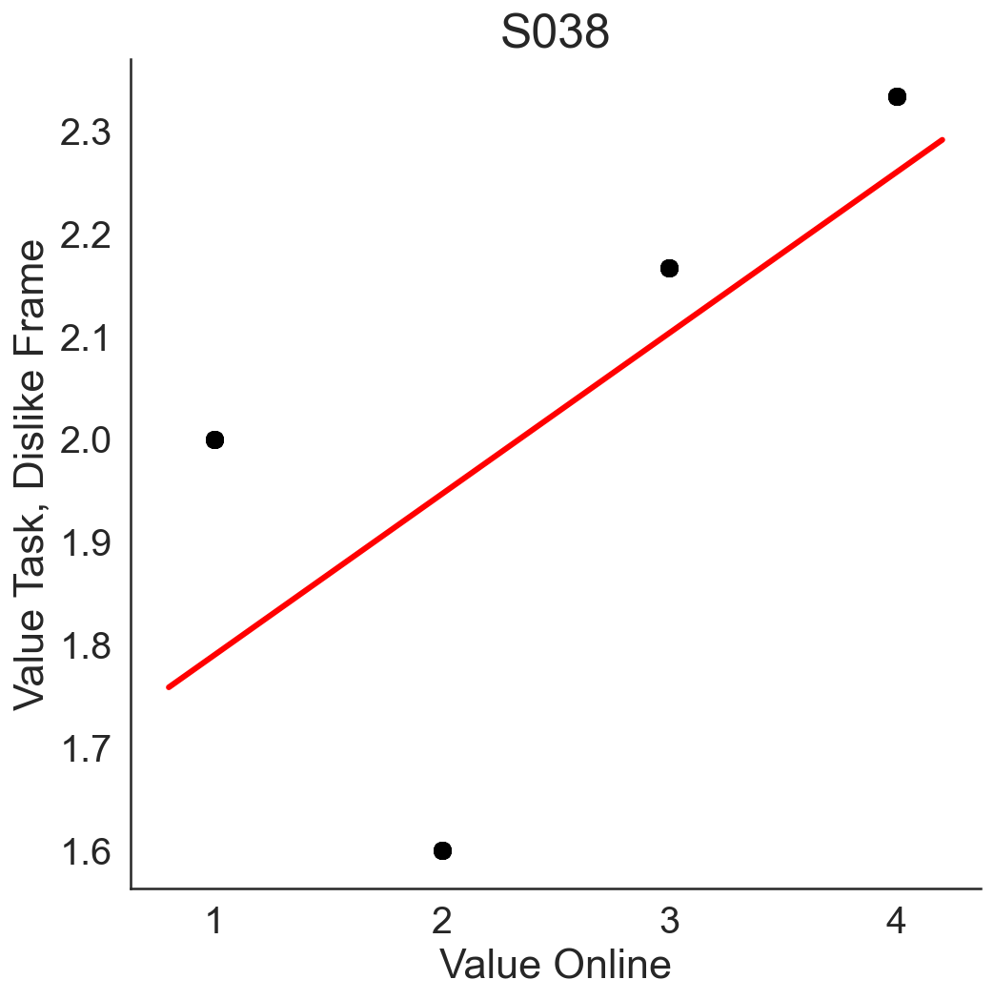

In [31]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
for part in data_exp1["Part"].unique(): 

    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'ValOnl','Value Online','Val2','Value Task, Dislike Frame', title = 'S0'+str(part))


## use only rating trials

In [32]:
data_exp_onlyRat = data_exp_ratings_2.loc[data_exp_ratings_2['rating']>0].copy()

In [33]:
data_exp_onlyRatL = data_exp_onlyRat.loc[data_exp_onlyRat['frame'] == 1].copy()
data_exp_onlyRatD = data_exp_onlyRat.loc[data_exp_onlyRat['frame'] == 2].copy()

Pearson's r = 0.715 p =  0.0
Pearson's r = -0.439 p =  0.032
Pearson's r = 0.741 p =  0.0
Pearson's r = -0.687 p =  0.0
Pearson's r = 0.764 p =  0.0
Pearson's r = -0.566 p =  0.004
Pearson's r = 0.631 p =  0.001
Pearson's r = -0.8 p =  0.0
Pearson's r = 0.709 p =  0.0
Pearson's r = -0.602 p =  0.002
Pearson's r = 0.785 p =  0.0
Pearson's r = -0.689 p =  0.001
Pearson's r = 0.833 p =  0.0
Pearson's r = -0.137 p =  0.523
Pearson's r = 0.86 p =  0.0
Pearson's r = 0.269 p =  0.215
Pearson's r = 0.786 p =  0.0
Pearson's r = -0.404 p =  0.05
Pearson's r = 0.86 p =  0.0
Pearson's r = -0.5 p =  0.013
Pearson's r = 0.902 p =  0.0
Pearson's r = -0.473 p =  0.019
Pearson's r = 0.895 p =  0.0
Pearson's r = -0.503 p =  0.02
Pearson's r = 0.522 p =  0.009
Pearson's r = -0.405 p =  0.05


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Pearson's r = 0.645 p =  0.001
Pearson's r = 0.076 p =  0.736
Pearson's r = 0.642 p =  0.001
Pearson's r = -0.459 p =  0.036
Pearson's r = 0.526 p =  0.008
Pearson's r = -0.375 p =  0.071
Pearson's r = 0.717 p =  0.0
Pearson's r = -0.109 p =  0.621
Pearson's r = 0.391 p =  0.059
Pearson's r = -0.522 p =  0.009
Pearson's r = 0.733 p =  0.0
Pearson's r = -0.865 p =  0.0
Pearson's r = 0.744 p =  0.0
Pearson's r = -0.857 p =  0.0
Pearson's r = 0.653 p =  0.001
Pearson's r = -0.615 p =  0.002
Pearson's r = 0.775 p =  0.0
Pearson's r = -0.602 p =  0.002
Pearson's r = 0.683 p =  0.0
Pearson's r = -0.342 p =  0.102
Pearson's r = 0.705 p =  0.0
Pearson's r = -0.531 p =  0.009
Pearson's r = 0.862 p =  0.0
Pearson's r = -0.482 p =  0.017
Pearson's r = 0.788 p =  0.0
Pearson's r = 0.674 p =  0.0
Pearson's r = -0.15 p =  0.484
Pearson's r = -0.315 p =  0.143
Pearson's r = 0.899 p =  0.0
Pearson's r = -0.632 p =  0.001
Pearson's r = 0.163 p =  0.458
Pearson's r = 0.228 p =  0.295


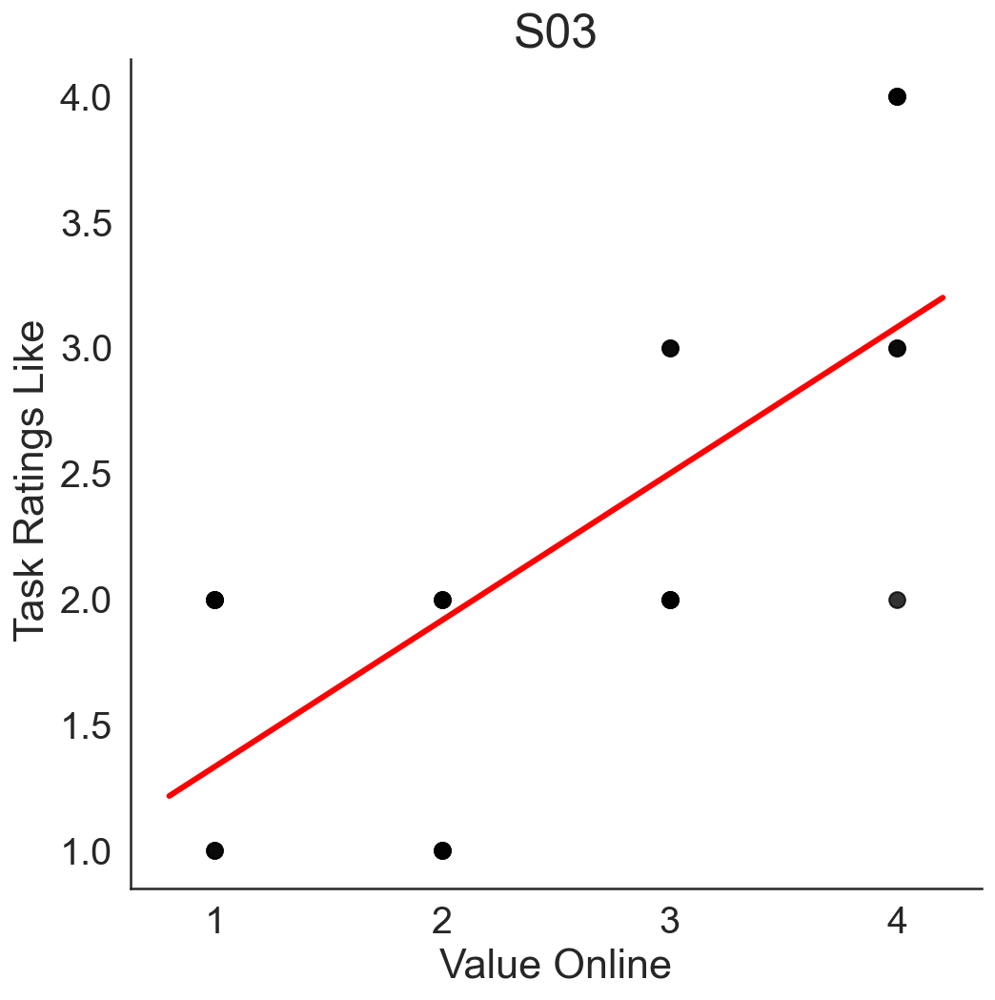

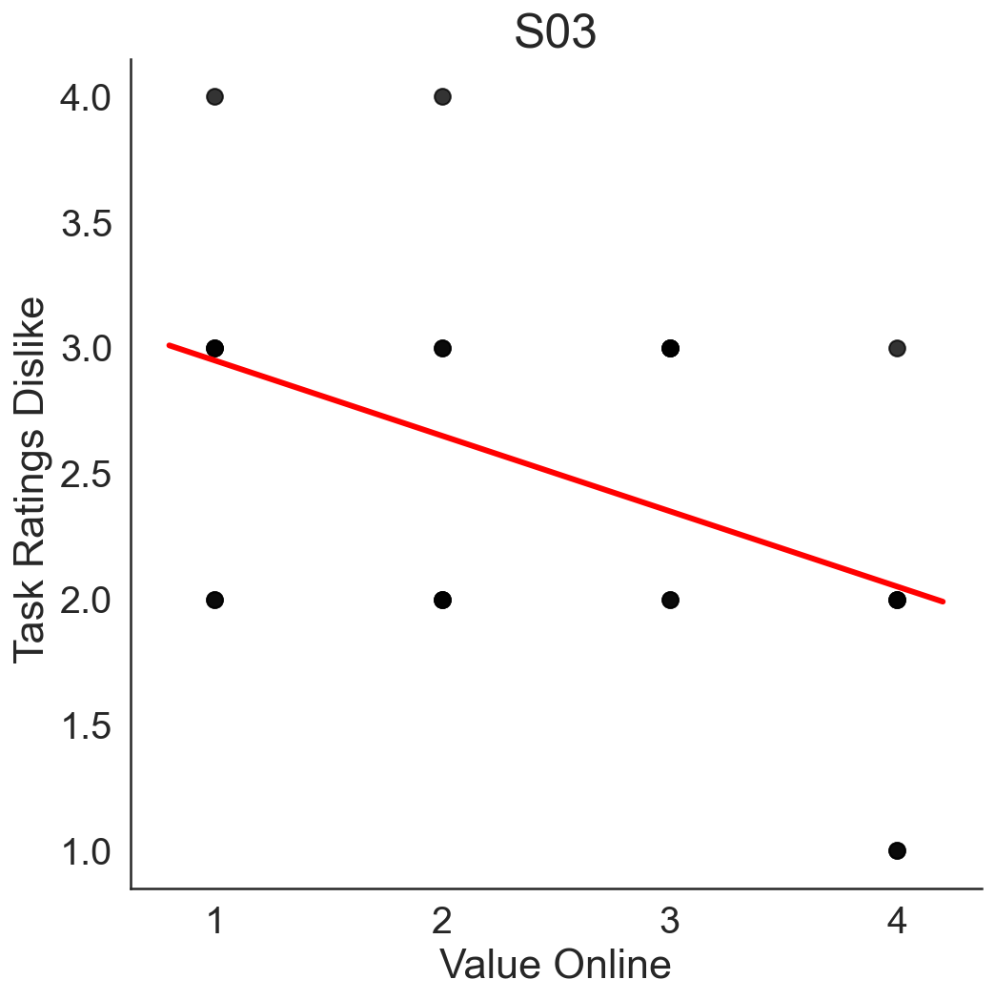

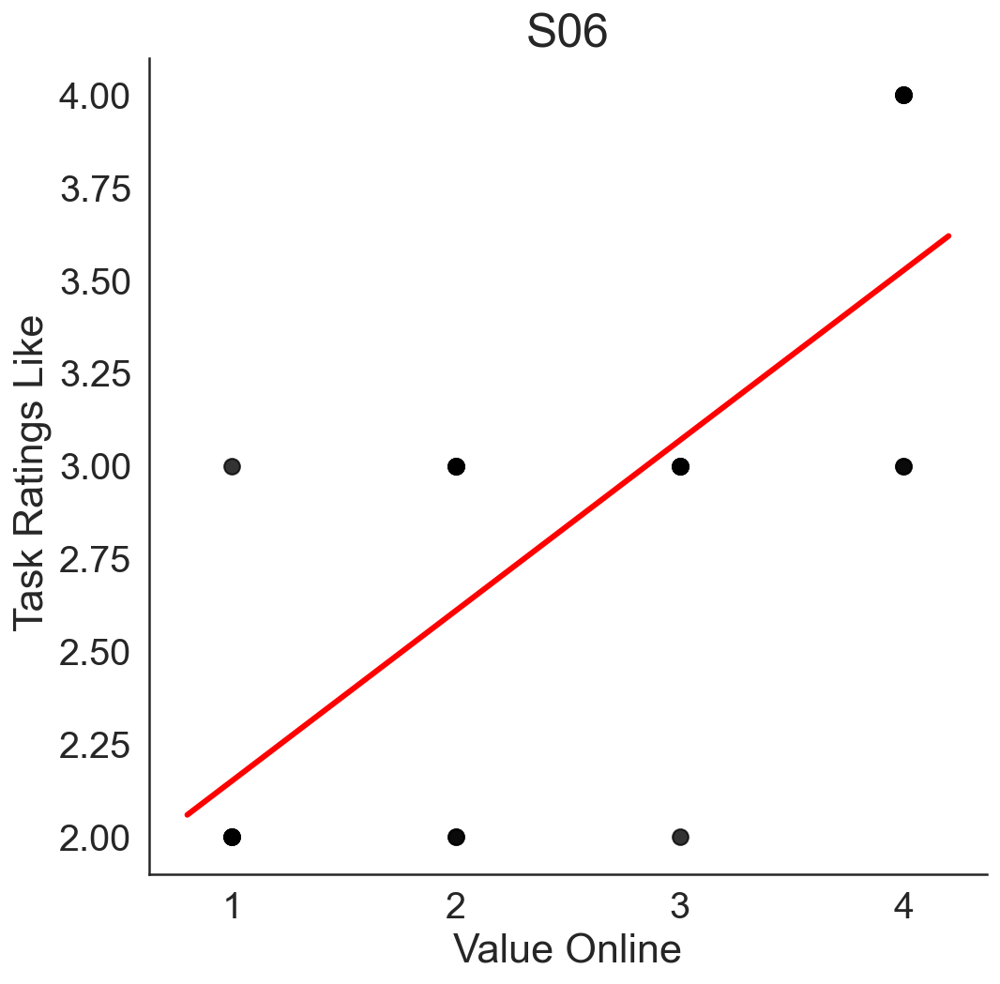

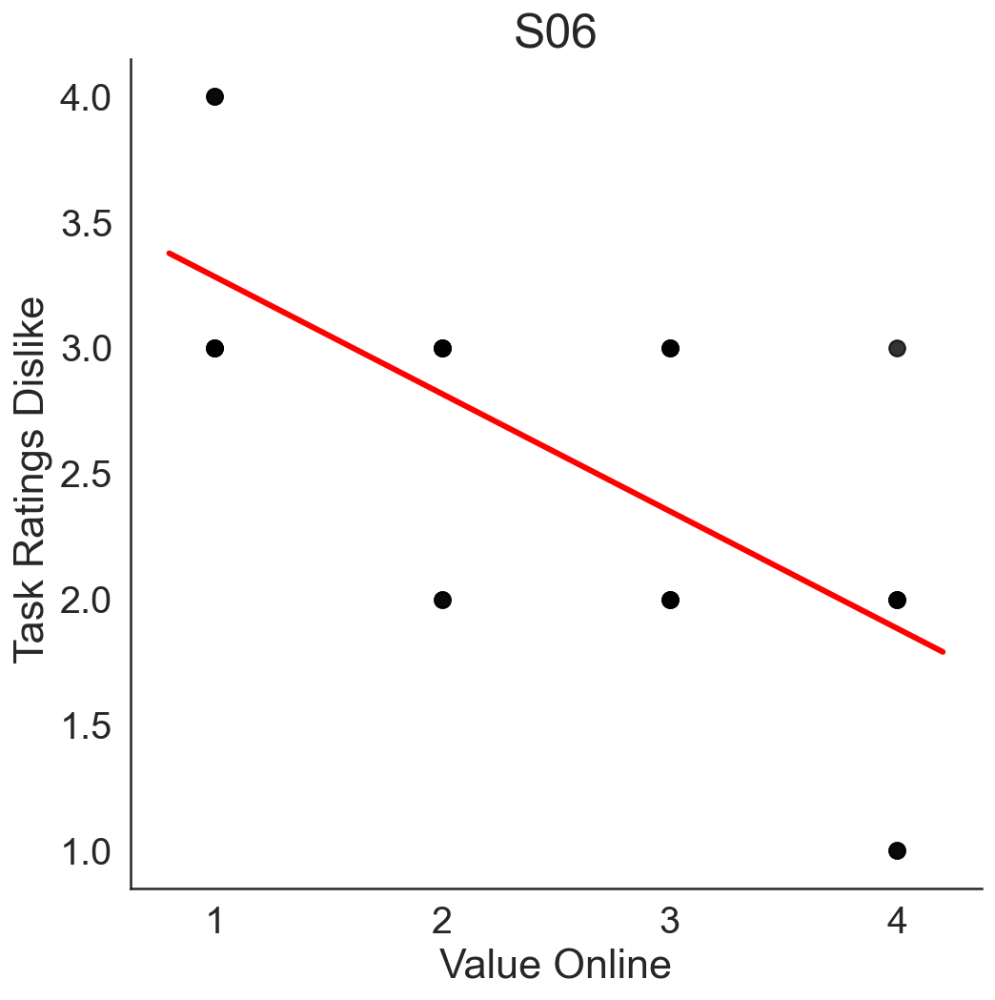

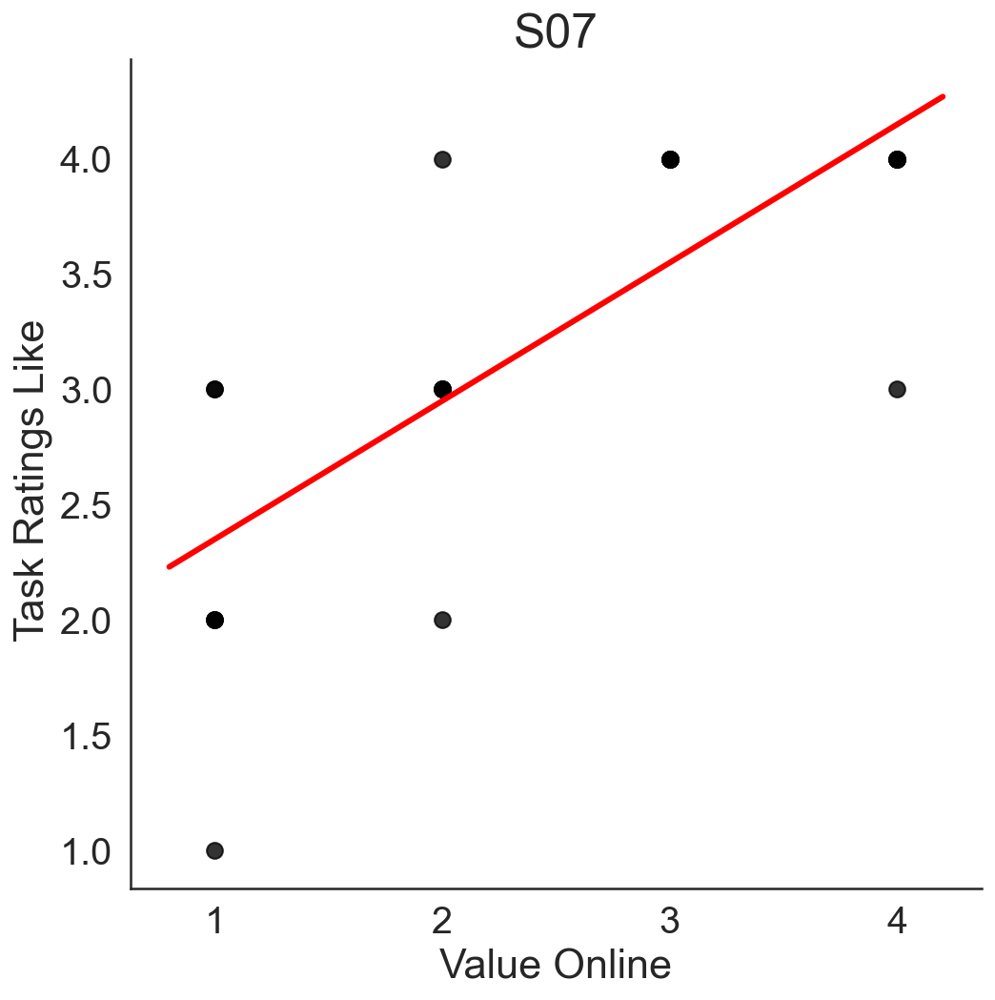

...

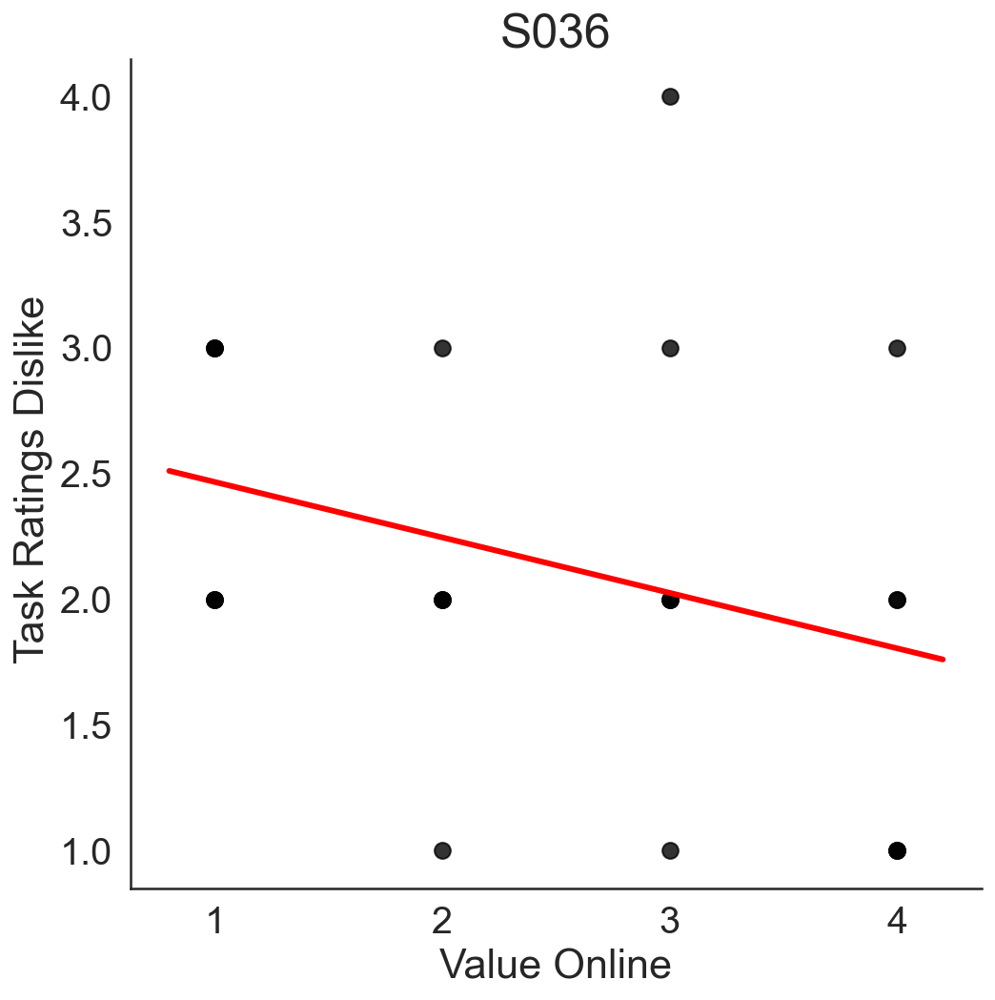

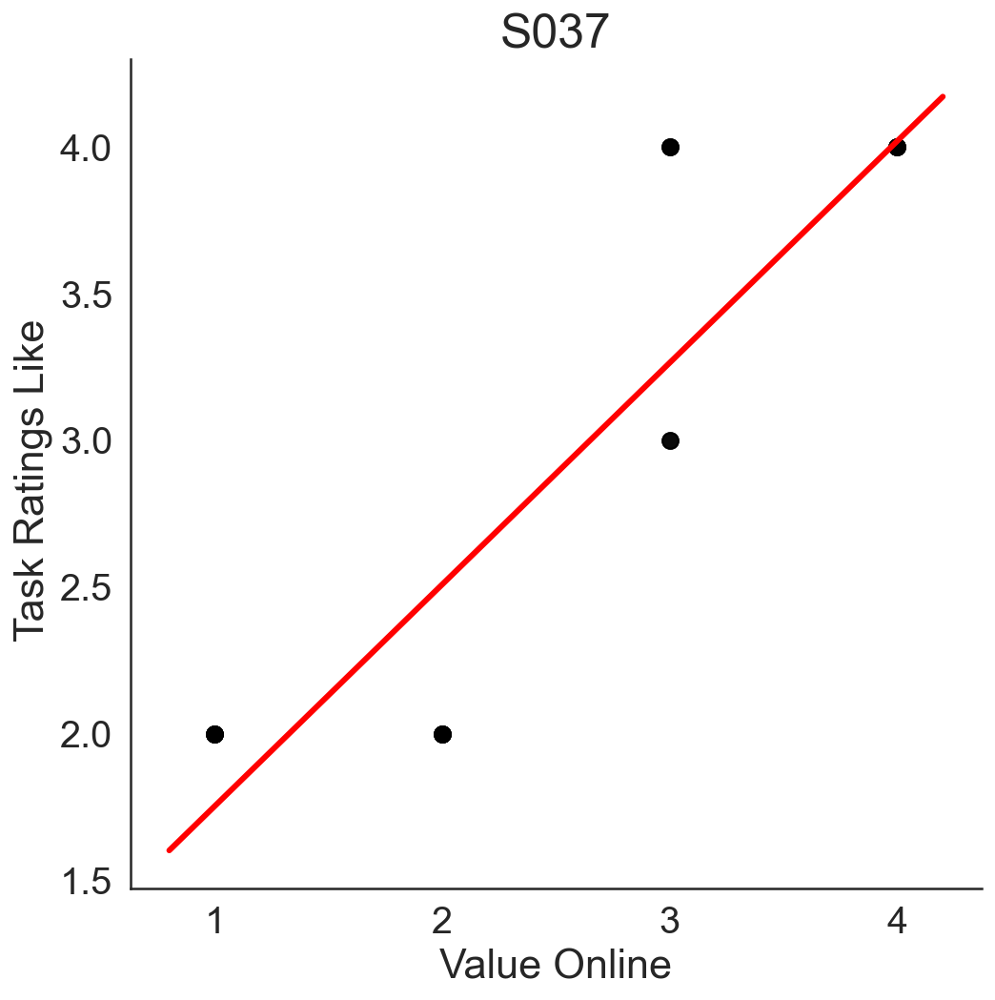

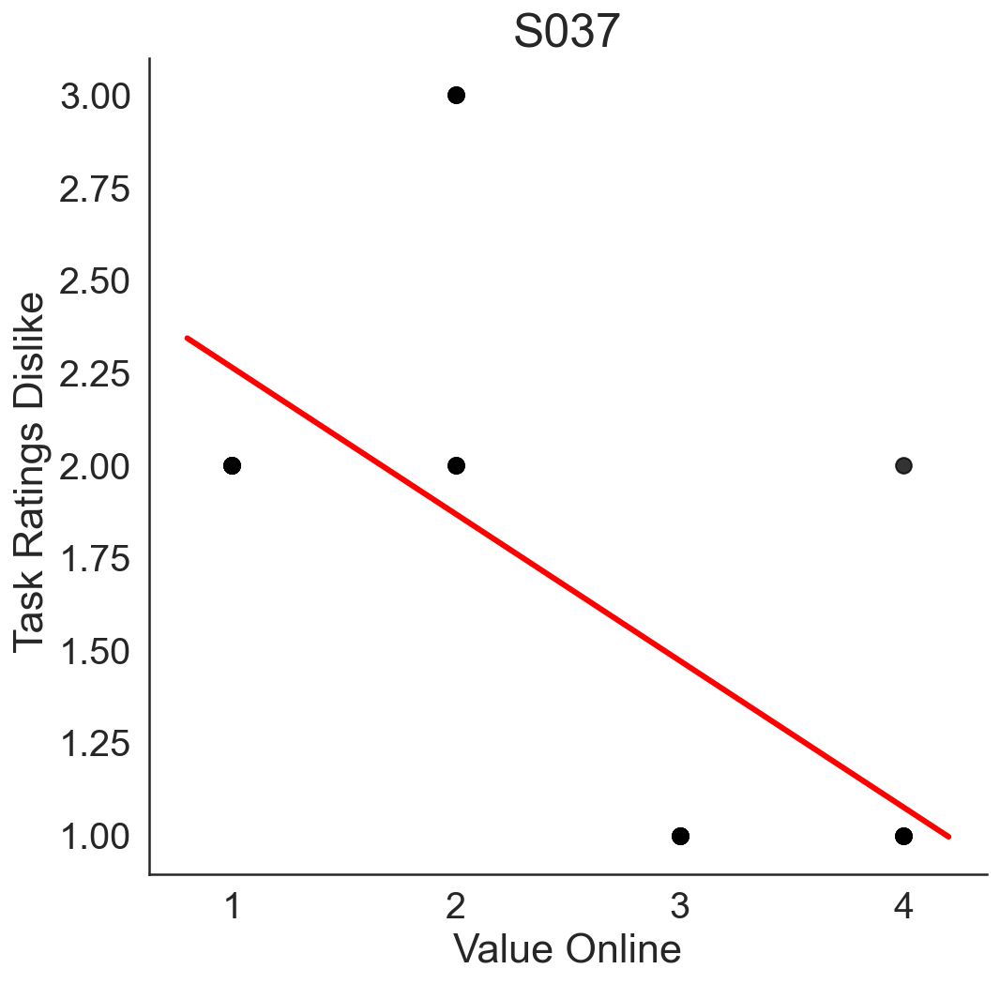

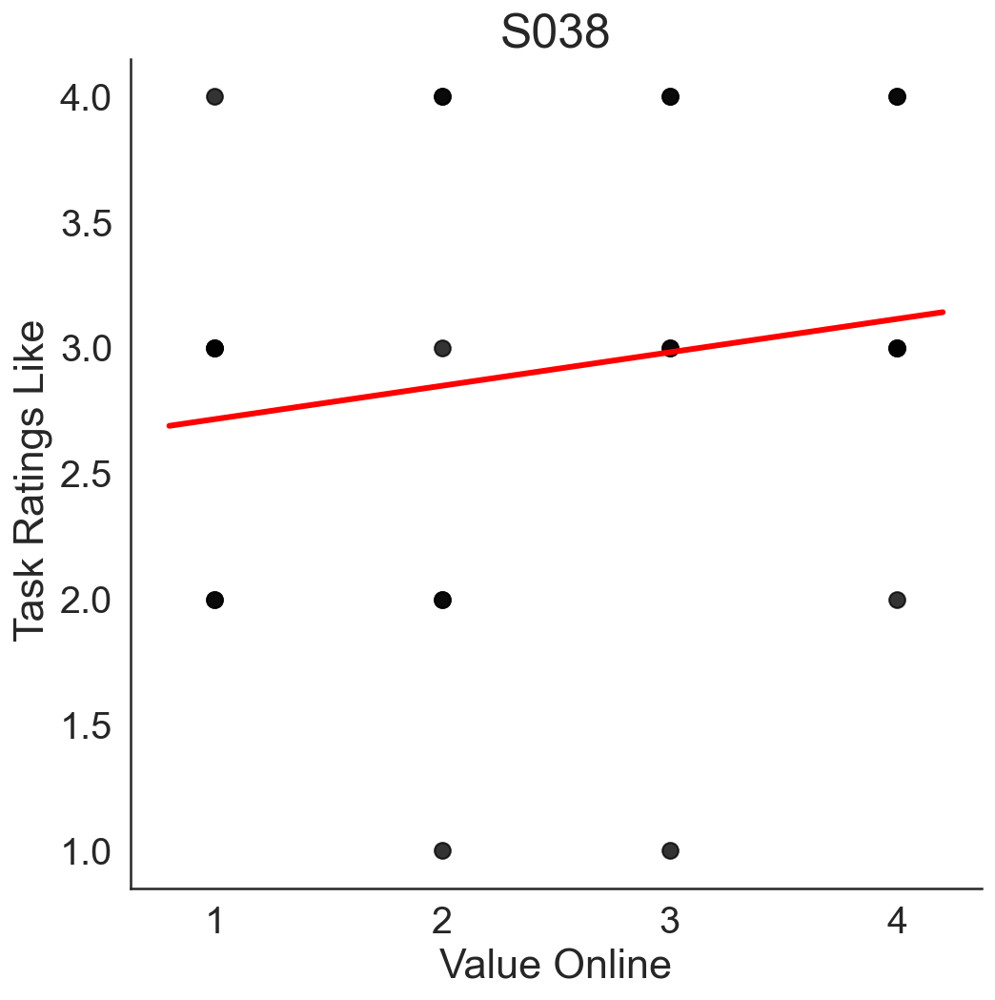

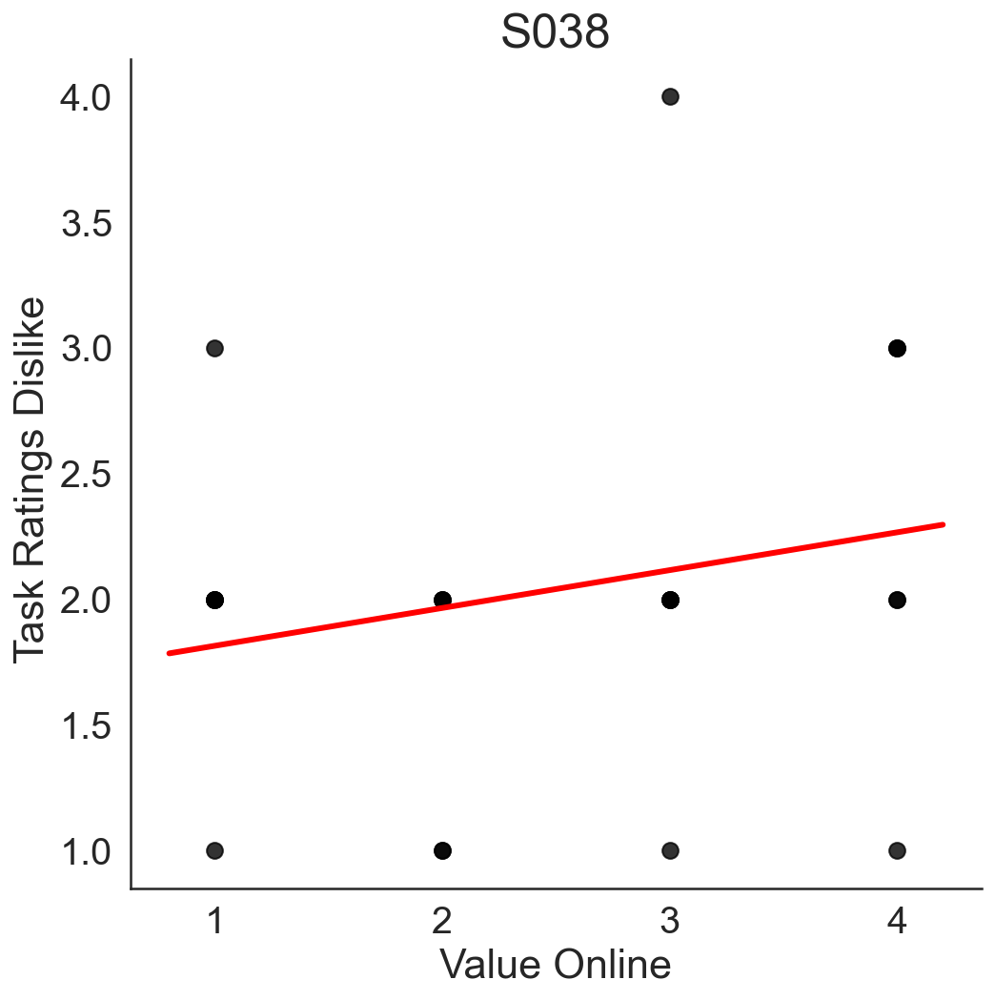

In [34]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
for part in data_exp1["Part"].unique(): 

    corrPlotSimple(data_exp_onlyRatL.loc[(data_exp_onlyRatL['Part'] == part)], 'ValOnl','Value Online','rating','Task Ratings Like ', title = 'S0'+str(part))
    corrPlotSimple(data_exp_onlyRatD.loc[(data_exp_onlyRatD['Part'] == part)], 'ValOnl','Value Online','rating','Task Ratings Dislike ', title = 'S0'+str(part))


#  Choice data analysis
-----------------------------------------------------------------------

## 2. accuracy per participant - Based on online rankngs of Pets

In [66]:
accuracies = pd.DataFrame( columns = [])

In [67]:
accuracy_like = []
accuracy_dislike = []

for i in data_exp1.Part.unique():
    print(i)
    accuracy_like.append(data_exp1.loc[(data_exp1['frame'] == 1) & (data_exp1['Part'] == i)].correctOn.mean())
    #print(accuracy_like)

    accuracy_dislike.append(data_exp1.loc[(data_exp1['frame'] == 2) & (data_exp1['Part'] == i)].correctOn.mean())
    #print(accuracy_dislike)

accuracies['participant'] = range(len(data_exp1.Part.unique()))
accuracies['like'] = accuracy_like
accuracies['dislike'] = accuracy_dislike


3
6
7
9
10
11
12
13
14
17
18
19
20
21
22
23
24
25
26
28
29
30
31
33
34
35
36
37
38


In [70]:
accuracies

,participant,like,dislike
0,0,0.777778,0.791667
1,1,0.986111,0.944444
2,2,0.902778,0.777778
3,3,0.847222,0.916667
4,4,0.875000,0.847222
5,5,0.972222,0.986111
6,6,0.986111,1.000000
7,7,0.958333,1.000000
8,8,0.972222,0.986111
9,9,0.944444,0.958333


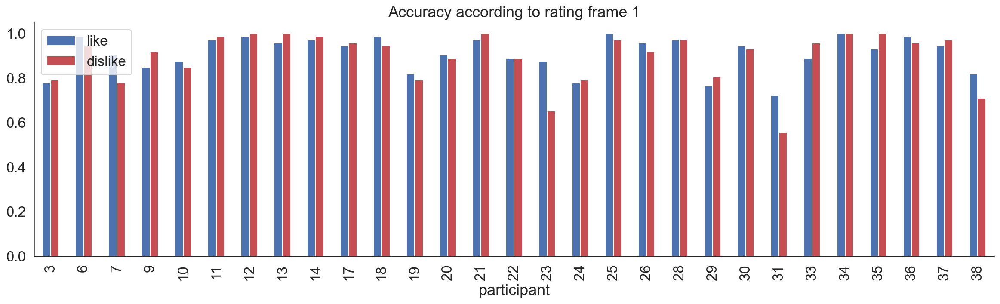

In [71]:
accuracies.plot.bar(x='participant',y=['like','dislike'], figsize=(20,5),title = 'Accuracy according to rating frame 1',color = ['b','r'])
plt.xticks(range(0,len(data_exp1["Part"].unique())), data_exp1["Part"].unique())

sns.despine()


Ttest_relResult(statistic=1.2627099074590786, pvalue=0.21710860740801002)

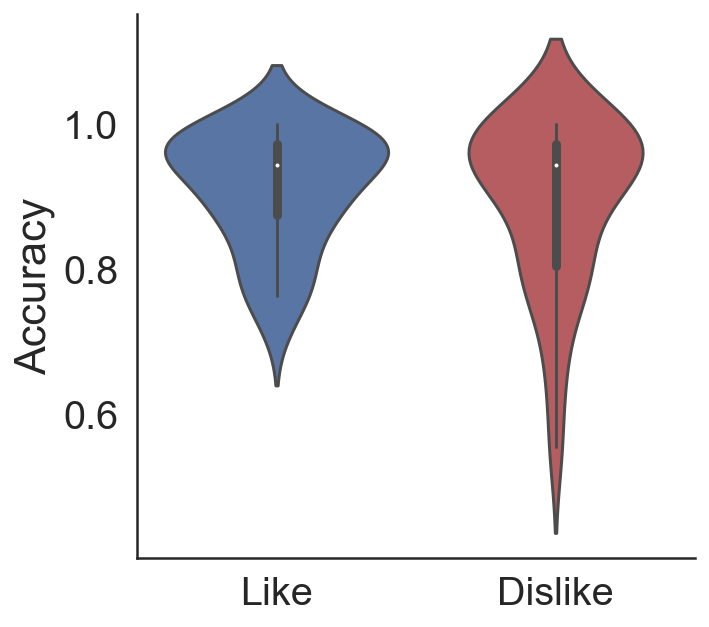

In [72]:

sns.set(style='white', font_scale=1.8)
my_pal = {"like":"b" ,"dislike":"r"}
bplot = sns.violinplot(data=accuracies[ ['like','dislike']], palette=my_pal).set(ylabel='Accuracy')
plt.xticks([0, 1,], ['Like', 'Dislike'])
sns.despine()

stats.ttest_rel(accuracies['like'], accuracies['dislike'])

In [73]:
print('meanRT, like: ' + str(accuracies['like'].mean()))
print('meanRT, dislike: ' + str(accuracies['dislike'].mean()))
print('sdRT, like: ' + str(accuracies['like'].std()))
print('sdRT, dislike: ' + str(accuracies['dislike'].std()))

meanRT, like: 0.9094827586206895
meanRT, dislike: 0.8936781609195402
sdRT, like: 0.0799254131790136
sdRT, dislike: 0.11550559949178786


## Split dataframe for like and dislike

In [40]:
data_expL = data_exp1.loc[(data_exp1['frame'] == 1)] # 1 = Like, 2 = Dislike
data_expD = data_exp1.loc[(data_exp1['frame'] == 2)] # 1 = Like, 2 = Dislike

In [41]:
#data_expL = data_exp1.loc[(data_exp1['frame'] == 1) & (data_exp1['Part'] == 4)] # 1 = Like, 2 = Dislike
#data_expD = data_exp1.loc[(data_exp1['frame'] == 2) & (data_exp1['Part'] == 4)] # 1 = Like, 2 = Dislike

## 3. relationship between RT and |DV| (using ratings given in LIKE frame)

## 4. logistic plots for choice in like and dislike frames

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

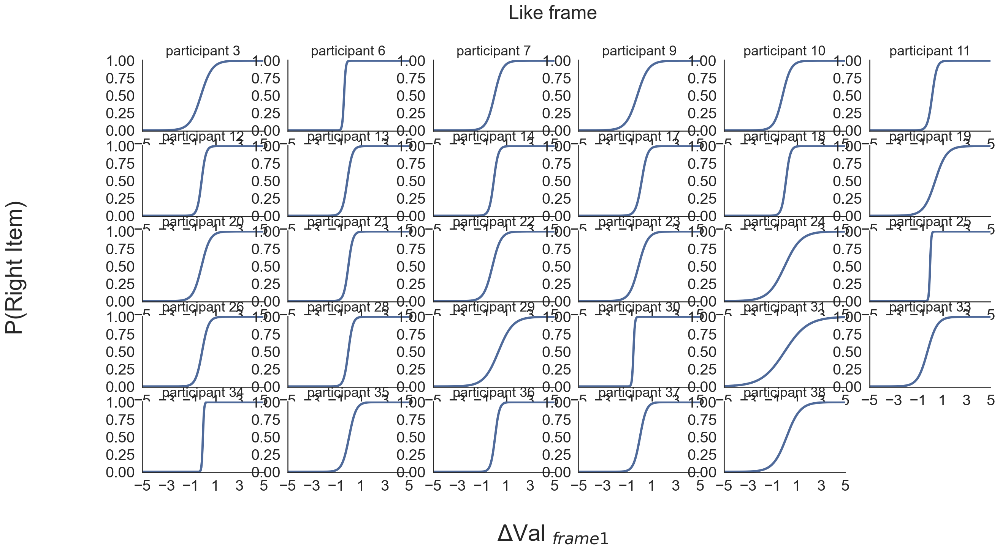

In [42]:
logisticplot_all_part( data=data_expL, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#4F6A9A', title='Like frame', parvar='Part')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

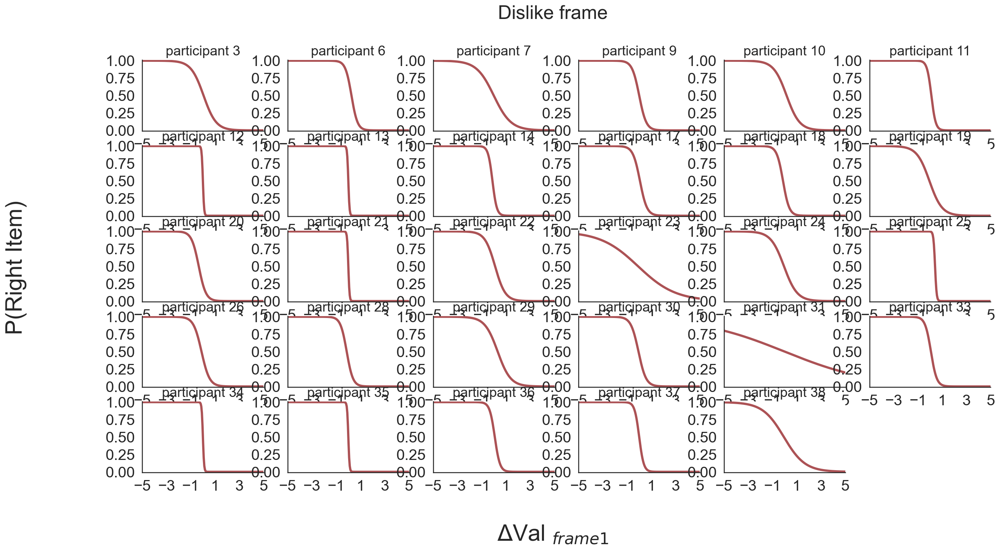

In [43]:
logisticplot_all_part( data=data_expD, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#AC5255', title='Dislike frame', parvar='Part')

## 5. considering logistics plots aggregating all participants

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


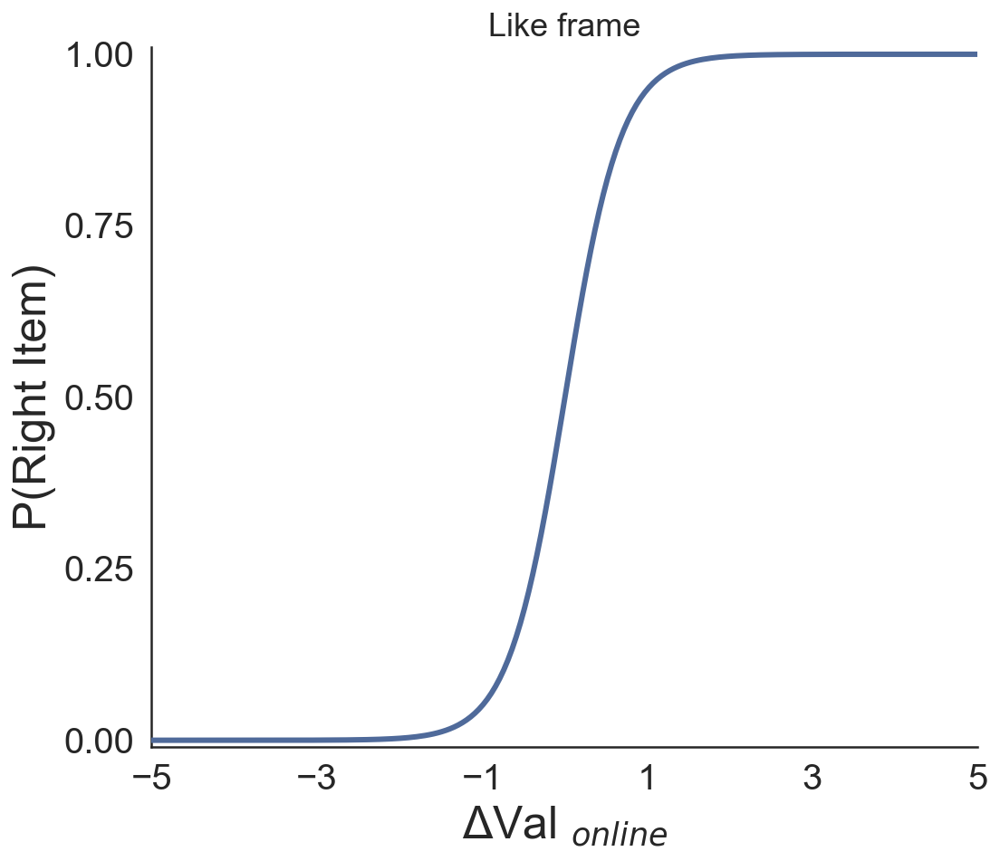

In [64]:
logisticplot_all( data=data_expL, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{online}$',
                 modlowcol='#4F6A9A', title='Like frame', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


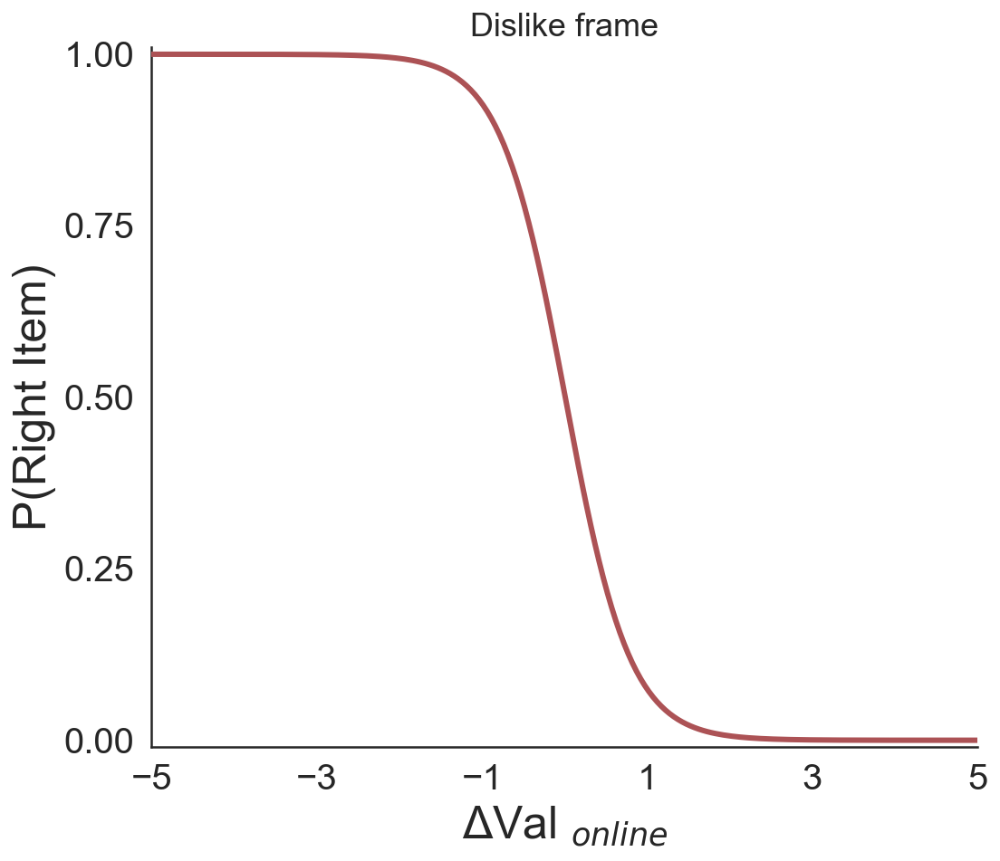

In [56]:
logisticplot_all( data=data_expD, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{online}$',
                 modlowcol='#AC5255', title='Dislike frame', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

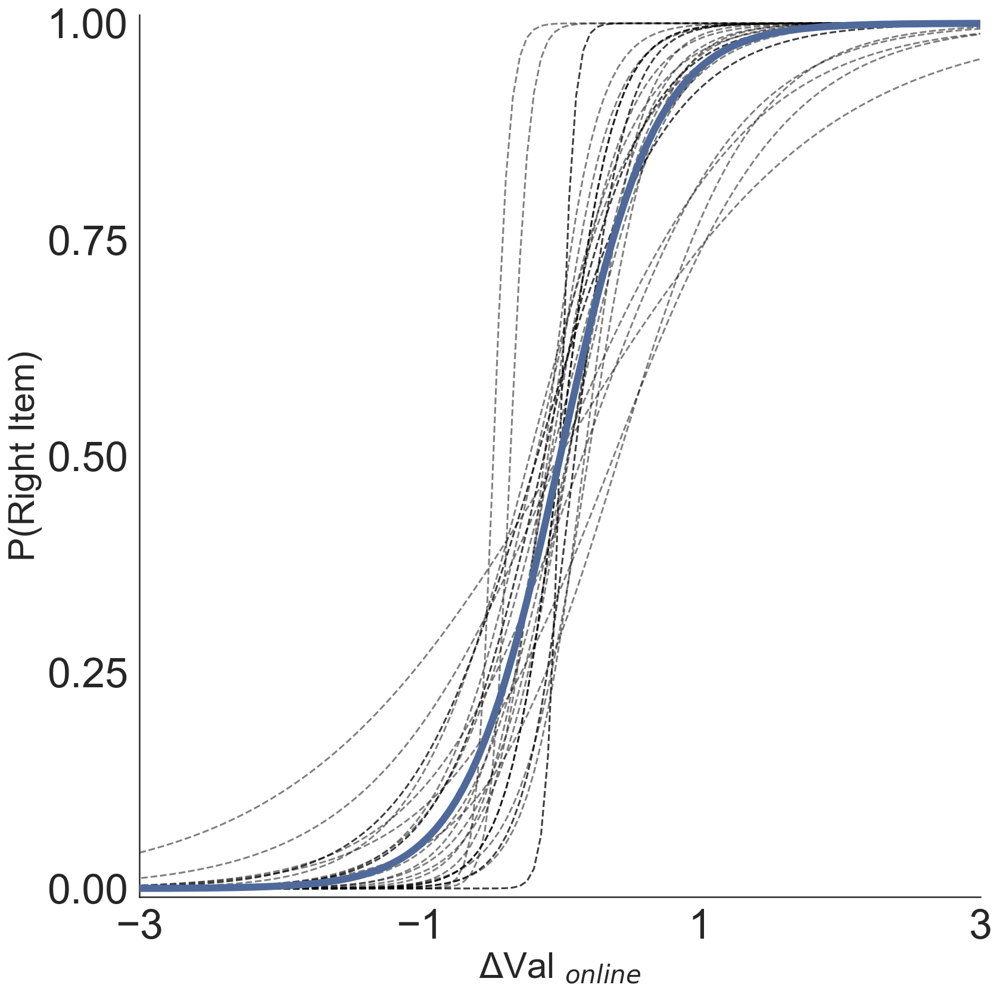

In [57]:
logisticplot_all_full( data=data_expL, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{online}$',
                 modlowcol='#4F6A9A', title='', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

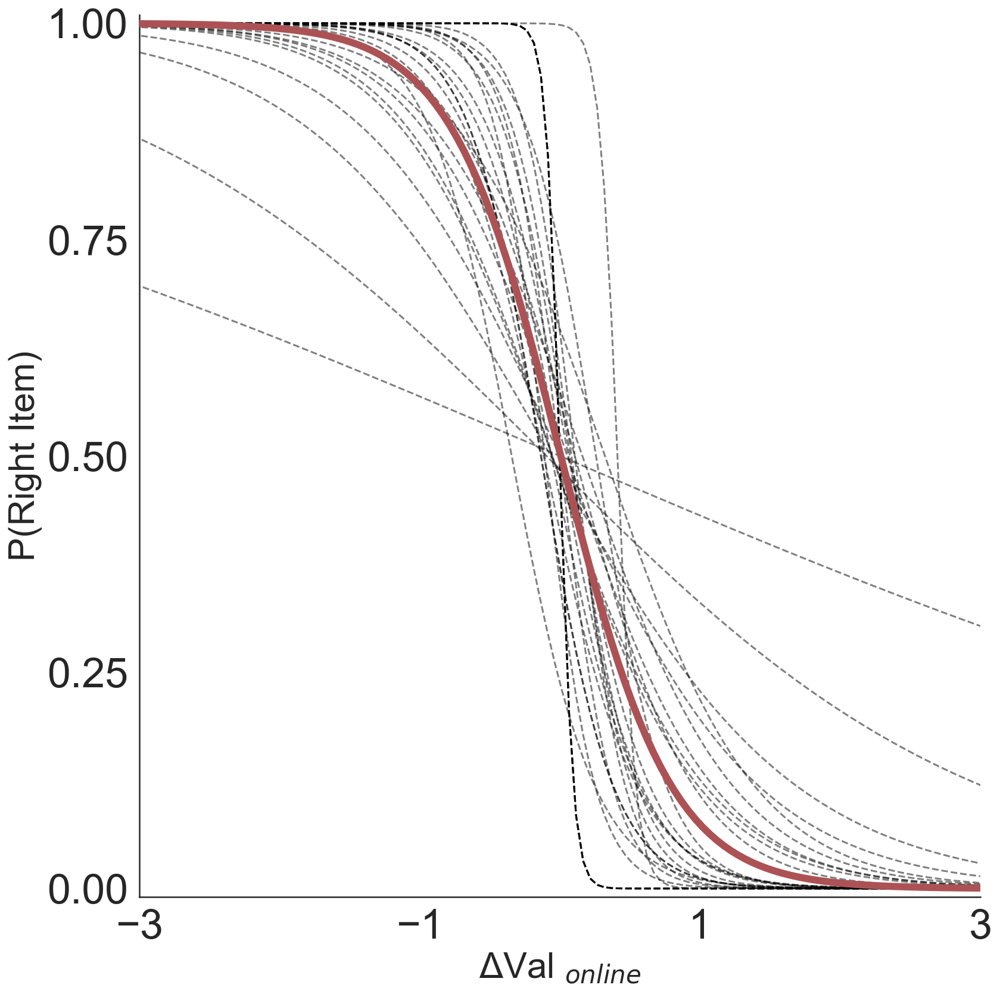

In [58]:
logisticplot_all_full( data=data_expD, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{online}$',
                 modlowcol='#AC5255', title='', parvar='Part')
plt.tight_layout()

## 6. (preliminar) regression analysis on Choice
### zDVal1: difference in value (mean ratings for pet right -left) in like frame (frame 1)
### zDVal2: difference in value (mean ratings for pet right -left) in dislike frame (frame 2)
### zDVarX: difference in rating variability (mean variability pet right -left)  in frame X


In [59]:
%R -i data_exp1
data_exp1

,index,trial,trialOnset,leftId,rightId,frame,trialOnsetTim,trialSnd1Tim,trialSnd2Tim,trialThinkTime,...,RValOnFlip,zLValOnFlip,zRValOnFlip,zChosenValOnFlipDis,zUnchosenValOnFlipDis,zDChoUnchosenOnFlipDis,zTotValOnFlipDis,zRT,correctOn,choices
0,0,0.0,97.154134,6.0,2.0,2.0,97.162739,98.174875,98.675894,100.661222,...,2,1.341641,-0.447214,-1.230401,2.217432,-2.415792,0.769699,-1.602820,0,1
1,1,1.0,107.304030,5.0,6.0,1.0,107.314542,108.334392,108.835600,110.819337,...,4,0.447214,1.341641,-2.328418,0.126075,-1.670439,-1.539399,-1.546306,0,1
2,2,2.0,118.904234,6.0,2.0,1.0,118.911135,119.928075,120.429292,122.413088,...,2,1.341641,-0.447214,-0.132385,-0.919604,0.565623,-0.769699,-1.454780,1,1
3,3,3.0,131.955079,5.0,6.0,2.0,131.961902,132.989758,133.490987,135.456976,...,4,0.447214,1.341641,-0.132385,2.217432,-1.670439,1.539399,-1.374383,0,0
4,4,4.0,162.405880,5.0,2.0,1.0,162.413470,163.444844,163.946065,165.916748,...,2,0.447214,-0.447214,-0.132385,0.126075,-0.179731,0.000000,-1.158225,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4171,5179,19.0,449.514783,2.0,5.0,1.0,449.522606,450.555727,451.056159,453.021524,...,4,-1.341641,1.341641,0.959309,-1.015400,1.301327,0.000000,0.854867,1,0
4172,5180,20.0,462.564662,2.0,5.0,1.0,462.571716,463.607038,464.107199,466.073238,...,4,-1.341641,1.341641,0.959309,-1.015400,1.301327,0.000000,0.949666,1,0
4173,5181,21.0,491.565453,5.0,2.0,2.0,491.573173,492.612295,493.112731,495.074771,...,1,1.341641,-1.341641,0.959309,-1.015400,1.301327,0.000000,1.166760,1,0
4174,5182,22.0,530.717474,1.0,6.0,2.0,530.725057,531.743107,532.244463,534.225137,...,2,0.447214,-0.447214,-1.000422,1.058917,-1.357098,0.000000,1.458080,0,1


In [60]:
%%R
# Separating the data for both conditions 
data_exp1_Like <- data_exp1[ which(data_exp1$frame=='1'), ]
data_exp1_DisLike <- data_exp1[ which(data_exp1$frame=='2'), ]

[1] "Like BIC:"
[1] 1218.962
[1] "DisLike BIC:"
[1] 1421.947


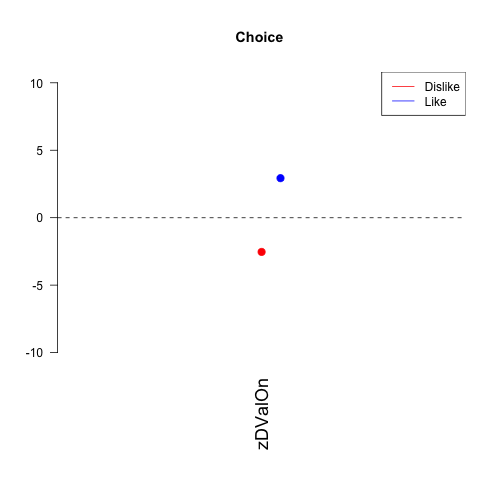

In [61]:
%%R
title_plot = "Choice "

ModelChoiceL_1 <- glm(choices ~ zDValOn , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(choices ~ zDValOn , data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-10, 10) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

## Since I don't have confidence I try to predict RT

[1] "Like BIC:"
[1] 5927.842
[1] "DisLike BIC:"
[1] 5903.001


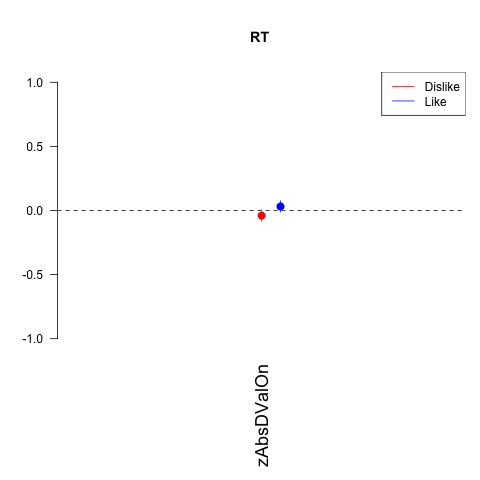

In [62]:
%%R
title_plot = "RT "

ModelChoiceL_1 <- glm(zRT ~ zAbsDValOn   , data=data_exp1_Like, )
ModelChoiceD_1 <- glm(zRT ~ zAbsDValOn   , data=data_exp1_DisLike, )

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1, 1) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 5937.17
[1] "DisLike BIC:"
[1] 5913.482


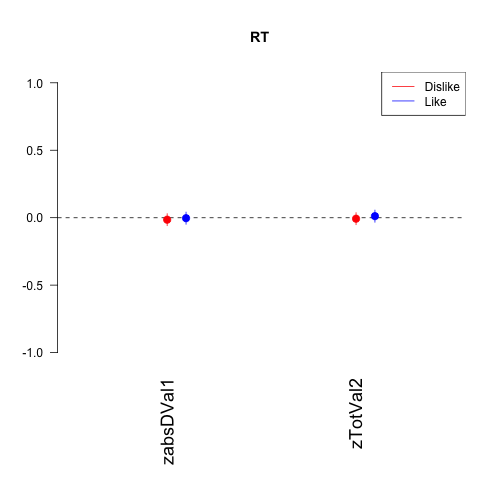

In [63]:
%%R
title_plot = "RT "

ModelChoiceL_1 <- glm(zRT ~ zabsDVal1 + zTotVal2  , data=data_exp1_Like, )
ModelChoiceD_1 <- glm(zRT ~ zabsDVal1 + zTotVal2  , data=data_exp1_DisLike, )

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1, 1) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

-----------------------------------------------------

# Import toolboxes and functions

In [1]:
import numpy as np
import pandas as pd
from pandas.core.frame import DataFrame as DF

import seaborn as sns
sns.set(color_codes=True)
#np.random.seed(sum(map(ord, "distributions")))
from sklearn import linear_model  # packages for the logistic regression function to plot the logistic regression 
from sklearn.linear_model import LogisticRegression # packages for the logistic regression function to plot the logistic regression 
import scipy
from scipy import stats, integrate
from scipy.stats import mode
from scipy.stats.stats import pearsonr # Pearson's correlation
from copy import copy as copy
import operator as operator
import pylab

# Plotting tools
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
%pylab inline
figsize(5, 5)

import glob

import os
# Added to avoid OMP:error#15
os.environ['KMP_DUPLICATE_LIB_OK']='True'

Populating the interactive namespace from numpy and matplotlib


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['pylab', 'copy']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [2]:
def logisticplot_all (data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(8,7))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()

    #run the classifier
    clf = linear_model.LogisticRegression(C=1e5)

    logit_all = {}

    # I think this defines the problem space
    X_test = np.linspace(-5,10,300)

   #fitting the predictive logistic model for all the trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data[xaxis][:, np.newaxis],
            data[yaxis])
    logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

    #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)
    
    all_coef = clf.coef_
    all_intercept = clf.intercept_
    
    #Plotting the predictive lines
    line_all = sub.plot(X_test, logit_all, color=modlowcol, linewidth=3, zorder=5,linestyle='-')

   # #Plotting the binned data
   # data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values
    
   # # determine the x coordinates
   # x_cords= data.groupby('DVBin2')[xaxis].mean()
    
   # # determine low y coordinates
   # y_cords_low = data.loc[(data[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values
    
   # # determine low y standard errors
   # test = pd.DataFrame(data.loc[(data[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
   # y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    
   # # determine high y coordinates
   # y_cords_high = data.loc[(data[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values
    
   # # determine high y standard errors
   # test2 = pd.DataFrame(data.loc[data[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
   # y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
   # # plot the low points
   # plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
   # # plot low error bars
   # plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)
    
   # # plot the high points
   # plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
   # # plot high error bars
   # plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)
    
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=25)
    sub.set_xlabel(xlab, fontsize=25)

    # Set Ticks
    sub.set_xticks((-5,-3,-1,1,3,5))
    sub.set_yticks((0,0.25,0.5,0.75,1))
    sub.tick_params(axis='both', which='major', labelsize=20)

    # Set Limits
    sub.set_ylim(-0.01, 1.01)
    sub.set_xlim(-5, 5)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    #sub.legend(loc=0, prop={'size':20})
    sns.despine()

In [3]:
def logisticplot_all_part (data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
 
    # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()
    fig = figure(figsize=(20,10))
    fig.set_facecolor('white')
    
    
    # Counter to know where to plot the particpant
    order = 1

    
    for x in participants:

            sub={}
            sub['%s' % x] = plt.subplot(int(len(participants)/6+1), 6, order)

            data_in = data.loc[data['Part'] == x]
            sns.set(font_scale=1.5, style='white')
            
            # defining the sigmoid function
            def model(x):
                y = 1 / (1 + np.exp(-x))
                return y

            sub['%s' % x].set_title('participant %s' % x)


            #run the classifier
            clf = linear_model.LogisticRegression(C=1e5)

            logit_all = {}

            # I think this defines the problem space
            X_test = np.linspace(-5,10,300)

           #fitting the predictive logistic model for all the trials, for a participant specified by x
                    # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in[xaxis][:, np.newaxis],
                    data_in[yaxis])
            logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)

            all_coef = clf.coef_
            all_intercept = clf.intercept_

            #Plotting the predictive lines
            line_all = sub['%s' % x].plot(X_test, logit_all, color=modlowcol, linewidth=3, linestyle='-')
            #line_all = sub['%s' % x].plot(X_test, logit_all, color="#000000", linewidth=3, label=modlow, zorder=5,linestyle='--')

           # #Plotting the binned data
           # data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values

           # # determine the x coordinates
           # x_cords= data.groupby('DVBin2')[xaxis].mean()

           # # determine low y coordinates
           # y_cords_low = data.loc[(data[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values

           # # determine low y standard errors
           # test = pd.DataFrame(data.loc[(data[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
           # y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

    
           # # determine high y coordinates
           # y_cords_high = data.loc[(data[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values

           # # determine high y standard errors
           # test2 = pd.DataFrame(data.loc[data[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
           # y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

           # # plot the low points
           # plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
           # # plot low error bars
           # plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)

           # # plot the high points
           # plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
           # # plot high error bars
           # plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)

    
            # Set Labels
            #sub['%s' % x].set_ylabel(ylab, fontsize=30)
           # sub['%s' % x].set_xlabel(xlab, fontsize=30)

            # Set Ticks
            sub['%s' % x].set_xticks((-5,-3,-1,1,3,5))
            sub['%s' % x].set_yticks((0,0.25,0.5,0.75,1))
            sub['%s' % x].tick_params(axis='both', which='major', labelsize=20)

            # Set Limits
            sub['%s' % x].set_ylim(-0.01, 1.01)
            sub['%s' % x].set_xlim(-5, 5)
            order += 1


    fig.text(0.5, 0.0, xlab, fontsize= 30, ha='center')
    fig.text(0.0, 0.5, ylab,fontsize= 30, va='center', rotation='vertical')
    
    #sub.legend(loc=0, prop={'size':20})
    fig.suptitle(title, fontsize = 25)

    
    sns.despine()

In [4]:
def z_score1(data_all, part_def,z_score_var):
    z_matrix=[]
    z_matrix_aux=[]

    for i in (data_all[part_def].unique()):
        Choicedata = data_all.loc[data_all[part_def] == i]    
    
        pX_A= pd.to_numeric(Choicedata[z_score_var]) 
        pX_zA= (pX_A - np.mean(pX_A))/np.std(pX_A)

        z_matrix_aux= pX_zA.values
    
        for  j in range(len(z_matrix_aux)):    
            z_matrix.append(z_matrix_aux[j])
    return z_matrix

In [5]:
def participant_densities(data, var, xlim=(0,100), rug=True, title = ''):
    # a counter that tells us where a given participant's data should be plotted
    order = 1

    # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()

    # defining the figure size
    sns.set_style('white')
    fig = figure(figsize=(40,20))

    for x in participants:
        # defining the sub figures
            sub={}
            sub['%s' % x] = plt.subplot(len(participants)/2, 4, order)
            sns.kdeplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x], shade=True)
            #if rug==True:
            #    sns.rugplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x])
            sub['%s' % x].set_title('participant %s' % x)
            #sub['%s' % x].set_xlim(xlim)
            order += 1
    fig.suptitle(title, fontsize = 25)


In [6]:
def corrPlotSimple(data_exp1, x_variable,x_varlabel,y_variable,y_varlabel, title=''):
    
    data_exp1_drop = data_exp1.dropna(subset=[x_variable,y_variable])

    results = pearsonr(data_exp1_drop[x_variable], data_exp1_drop[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    
    f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_exp1_drop, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
    x=data_exp1_drop[x_variable]
    y=data_exp1_drop[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    ax.plot(future, future_fit, color='Red', lw=3)
    ax.set_title(title, fontsize = 25)

    sns.despine()

In [7]:
def corrPlotSimpleJitter(data_exp1, x_variable,x_varlabel,y_variable,y_varlabel, title=''):
    
    data_exp1_drop = data_exp1.dropna(subset=[x_variable,y_variable])

    results = pearsonr(data_exp1_drop[x_variable], data_exp1_drop[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", results[1])
    
    f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    
    #ax = sns.stripplot(x=x_variable, y=y_variable, data=data_exp1_drop, alpha=.2,jitter=True,edgecolor='#000000')
    ax = sns.regplot(data=data_exp1_drop, x= x_variable, y=y_variable, fit_reg=False,  x_jitter = 0.2, y_jitter = 0, ci=0, color='#000000', scatter_kws={'s':70,'alpha' : 1/3})
    
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
    x=data_exp1_drop[x_variable]
    y=data_exp1_drop[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    ax.plot(future, future_fit, color='Red', lw=3)
    ax.set_title(title, fontsize = 25)

    sns.despine()
    
    

In [8]:
def corrPlotPart(data_exp1, x_variable,x_varlabel,y_variable,y_varlabel, title=''):
    
    data_exp1_drop = data_exp1.dropna(subset=[x_variable,y_variable])

    results = pearsonr(data_exp1_drop[x_variable], data_exp1_drop[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    
    #f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_exp1_drop, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
    x=data_exp1_drop[x_variable]
    y=data_exp1_drop[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    ax.plot(future, future_fit, color='Red', lw=3)
    ax.set_title(title, fontsize = 25)

    sns.despine()
    


In [9]:
import rpy2

%load_ext rpy2.ipython
# Set up interface with R
# Make it easy to set and find values in a multi-index DF
idx = pd.IndexSlice
# Set up interface with R
%config InlineBackend.figure_format = 'retina'
import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore", category=RRuntimeWarning)


In [10]:
def logisticplot_all_full (data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(12,12))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()

    
    
    ## Generate plot for individual participants
    participants = data.loc[:, 'Part'].unique()

    for x in participants:

            
            data_in = data.loc[data['Part'] == x]
            
            # defining the sigmoid function
            def model(x):
                y = 1 / (1 + np.exp(-x))
                return y        

            #run the classifier
            clf = linear_model.LogisticRegression(C=1e5)

            logit_all = {}

            # I think this defines the problem space
            X_test = np.linspace(-5,10,300)

           #fitting the predictive logistic model for all the trials, for a participant specified by x
                    # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in[xaxis][:, np.newaxis],
                    data_in[yaxis])
            logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)

            all_coef = clf.coef_
            all_intercept = clf.intercept_

            #Plotting the predictive lines
            sub.plot(X_test, logit_all, color='black', linewidth=1.5, linestyle='--', alpha = 0.5)    
    
    
    
    
    ## Generate plot for  full data 
    #run the classifier
    clf = linear_model.LogisticRegression(C=1e5)

    logit_all = {}

    # I think this defines the problem space
    X_test = np.linspace(-5,10,300)

   #fitting the predictive logistic model for all the trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data[xaxis][:, np.newaxis],
            data[yaxis])
    logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

    #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)
    
    all_coef = clf.coef_
    all_intercept = clf.intercept_
    
    #Plotting the predictive lines
    line_all = sub.plot(X_test, logit_all, color=modlowcol, linewidth=6, zorder=5,linestyle='-')

    # #Plotting the binned data
    #data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=3).values
    
     # determine the x coordinates
    #x_cords= data.groupby('DVBin2')[xaxis].mean()
    
     # determine low y coordinates
    #y_cords_low = data.groupby('DVBin2')[yaxis].mean().values
    
     # determine low y standard errors
    #test = pd.DataFrame(data.groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
    #y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    

     # plot the  points
    #sub.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
     # plot error bars
    #sub.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)
    
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=30)
    sub.set_xlabel(xlab, fontsize=30)

    # Set Ticks
    sub.set_xticks((-5,-3,-1,1,3,5))
    sub.set_yticks((0,0.25,0.5,0.75,1))
    sub.tick_params(axis='both', which='major', labelsize=35)

    # Set Limits
    sub.set_ylim(-0.01, 1.01)
    sub.set_xlim(-3, 3)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    #sub.legend(loc=0, prop={'size':20})
    sns.despine()

In [12]:
%%R
library(lme4)
#library(car)
library(optimx)
#library(ggplot2)
library(MASS)
#library(broom)
library(dplyr)
library(reshape2)
library(arm)
library(multcomp)
library(pbkrtest)